### <center>Forecasting Asset Returns Using Machine Learning and Artificial Intelligence: A Quant Journey</center> 
#### <center>Author: J. Francisco Salazar</center>
#### <center>Date: March 2024</center>
### <center>AI in Finance: Navigating the Future </center>
#### <center>Conference at Texas State University, San Marcos</center>
#### <center>Date: April 26 - 27, 2024</center>
<center>Organized by: The Python Quants and the Department of Finance & Economics at McCoy College of Business, Texas State University.</center>

<br>
<br>
<br>
<br>

# Abstract
This project offers a comprehensive overview of time-series analysis, with a primary focus on the problem of forecasting asset returns for a diverse set of financial assets. It delves into the trading strategy development workflow, construction and vectorized backtesting of machine learning and AI-driven trading strategies. It illustrates the use state-of-the-art quantitative tools commonly favored by quants and offers valuable insights into strategy development and analysis. By integrating an array of financial packages—Quantstats for portfolio strategy, analytics, and reporting; MPL Finance and Pandas TA for technical analysis; and VectorBT, an advanced backtesting tool—this study presents a streamlined setup for the analysis and backtesting of trading strategies with Python. It also lays a solid foundation for further statistical analysis and could also be the basis for developing more robust predictive models, risk assessment strategies or portfolio construction. The step-by-step approach, along with clear explanations, enhances the clarity and educational value of the document.

<div style="margin-top: 250px;"></div>

*Disclaimer: some parts of this article have been enhanced with the assistance of AI, using AI-generated Python code or paragraph rephrasing for clarity improvement purposes.*

<div style="margin-top: 100px;"></div>

### Introduction

In their quest for uncorrelated strategies and alpha, fund managers are progressively embracing quantitative strategies. This shift is giving rise to a novel competitive edge through the implementation of cutting-edge Machine Learning quantitative methods to analyze this data. Machine Learning serves as a mechanism employing algorithms to identify patterns within data and forecast outcomes. Its techniques encompass supervised learning (with methodologies like regressions and classifications), unsupervised learning (involving clustering and models for 'unlabeled' data), the relatively recent advent of deep learning techniques that utilize neural networks, and reinforcement learning, which optimizes decision-making through trial and error with rewards and penalties, adding a dynamic dimension to strategy development.

Time-series forecasts in financial markets pose significant challenges due to their complexity and the low signal-to-noise ratio. Much of this difficulty stems from the noise generated by numerous external drivers, which opaques signals for forecasting, rendering financial time series "extremely stochastic and volatile." Simple time-series forecasting models frequently overlook these external drivers, diminishing their effectiveness and robustness. Additionally, the situation is complicated by the fact that the underlying drivers, such as inflation or volatility, are often non-stationary. Incorporating advanced techniques like machine learning and reinforcement learning, offers a promising avenue to improve the accuracy of forecasts. 

In this work, we attempt to tackle the problem of forecasting asset returns and offer an exploration to the construction and vectorized backtesting of trading strategies using methods from machine learning and AI. We showcase several use cases for the examination of financial market data, performance analysis, risk assessment, and predictive modeling (Part I); setting the stage for the development of algorithmic trading strategies across different asset classes using machine learning and AI (Part II).

### PART I: PRELIMINARY ANALYSIS 
This section is about applying basic techniques, approaches, and packages used by quant analysts such as data import, deriving summary statistics, calculating changes over time, handling missing data, etc... We start at the beginning with a description of time-series forecasting, identify some of the problems and discuss the importance of return (change) rather than level (price) forecasting. We then continue with a brief description of another problem in statistical analysis, the common assumption of a “Normal" distribution of data. 

## Imports & Random Seeds
Let's start with the initial sections of the notebook, which typically involve data loading, preprocessing, and an [exploratory data analysis (EDA)](https://link.springer.com/chapter/10.1007/978-3-319-43742-2_15#ref-CR5). Our data cleaning take place throughout the EDA process. We start the EDA process analyzing each feature individually (univariate), this will help identify outliers, missing values and or incorrect values first before moving to multivariate analysis. We'll move on to more complex analyses and model building in subsequent steps.

#### Package Imports
The list of import statements and initial setup cover a comprehensive range of libraries and configurations ideal for quantitative finance research. 

In [1]:
# Standard library imports
import random

# Third-party imports
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd
import pandas_ta as ta
import quantstats as qs
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm, skew, kurtosis
import statsmodels.api as sm
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report
from sklearn.preprocessing import MinMaxScaler

import vectorbt as vbt

import plotly.graph_objects as go

# Local application/library specific imports
from adjustText import adjust_text

#### Styling and Format Configuration

In [2]:
# Set the visual style
plt.style.use('seaborn-v0_8-darkgrid')
# mpl.rcParams['font.family'] = 'serif'
# Configuring matplotlib for SVG format which is good for high-quality images
%config InlineBackend.figure_format = 'svg'

#### Warnings Filter

In [3]:
import warnings
warnings.simplefilter('ignore')

#### Random Seed:
Setting a fixed seed for NumPy's random number generator ensures that our stochastic processes or machine learning models are reproducible, which is crucial for scientific research.

In [4]:
# Set a fixed seed for numpy's random number generator
# This ensures reproducibility of stochastic processes
np.random.seed(42)  
random.seed(42)

## Graphical Exploratory Data Analysis (EDA)
The main role of EDA is to explore the data, and graphs give us some of the best tools to do so, while being a first step to help us gain insight into the data. In this case, [Graphical EDA](https://link.springer.com/chapter/10.1007/978-3-319-43742-2_15#ref-CR5) since graphical representation of the dataset of interest is the principle feature of exploratory analysis.

Data visualization will showcase information about patterns, trends, seasonality and cyclicity within the data. For this project, as a basis for graphical univariate analysis we opt for the use of frequency distribution histograms, box plots, a time-series plot, and probability plots (Quantile-Quantile Plots/QQ Plots are used for assessing the distributional properties of the dataset).

#### Raw Data

In [5]:
url = 'https://certificate.tpq.io/rl4finance.csv'

The following code uses the `pd.read_csv()` function to import the time series data set from the url. The file contains end-of-day (EOD) data for different financial instruments as retrieved from the #### Data API.

In [6]:
# use of index_col=0 indicates that the first column in the CSV is being used as the index
# parse_dates=True ensures that the index is in a datetime format.
raw = pd.read_csv(url, index_col=0, parse_dates=True)

# raw = pd.read_csv("path/to/your/file.csv", index_col=0, parse_dates=True)

In [7]:
# raw.to_csv('local_rl4finance.csv') 

In [8]:
# raw.isnull().sum()

In [9]:
raw.head()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,.SPX,.VIX,SPY,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,,
2014-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.3752,1205.29,NaN,NaN
2014-01-02,19.754623,37.16,25.790,19.8985,176.89,1831.98,14.23,182.920,1.3670,1224.51,22.03,118.00
2014-01-03,19.320695,36.91,25.780,19.8220,178.15,1831.37,13.76,182.885,1.3587,1236.16,21.83,119.29
2014-01-06,19.426052,36.13,25.460,19.6815,179.37,1826.77,13.55,182.360,1.3627,1237.59,21.93,119.50
2014-01-07,19.287034,36.41,25.585,19.9015,178.29,1837.88,12.92,183.480,1.3615,1231.49,21.97,118.82


In [10]:
raw.tail()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,.SPX,.VIX,SPY,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,,
2023-12-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.1007,NaN,NaN,NaN
2023-12-26,193.05,374.66,50.50,153.41,381.61,4774.75,12.99,475.65,1.1042,2066.6050,31.67,191.72
2023-12-27,193.15,374.07,50.76,153.34,384.48,4781.58,12.43,476.51,1.1103,2077.1589,31.98,192.59
2023-12-28,193.58,375.28,50.39,153.38,386.41,4783.35,12.47,476.69,1.1059,2064.8601,31.17,191.47
2023-12-29,192.53,376.04,50.25,151.94,385.77,4769.83,12.45,475.31,1.1036,2062.5900,31.01,191.17


## Financial Data Visualization
**Use of Color Map:**  We define a `color map` for consistency in visualizing different financial instruments which will not only enhances the readability of the plot but also helps in quick identification of each instrument

In [11]:
# Defining a color map for the assets to keep consistency
color_map = {
    'AAPL.O': 'deepskyblue',
    'MSFT.O': 'orange',
    'INTC.O': 'green',
    'AMZN.O': 'red',
    'GS.N': 'orchid',
    '.SPX': 'maroon',
    '.VIX': 'lightpink',
    'SPY': 'gray',
    'EUR=': 'lime',
    'XAU=': 'cyan',
    'GDX': 'navy',
    'GLD': 'gold'
}

Below is a plot of the financial dataset, with each of the 12 financial instruments or indexes plotted as a separate subplot. This visualization provides an overview of the trends and fluctuations in each instrument or index over the period from January 1, 2014, to December 29, 2023.

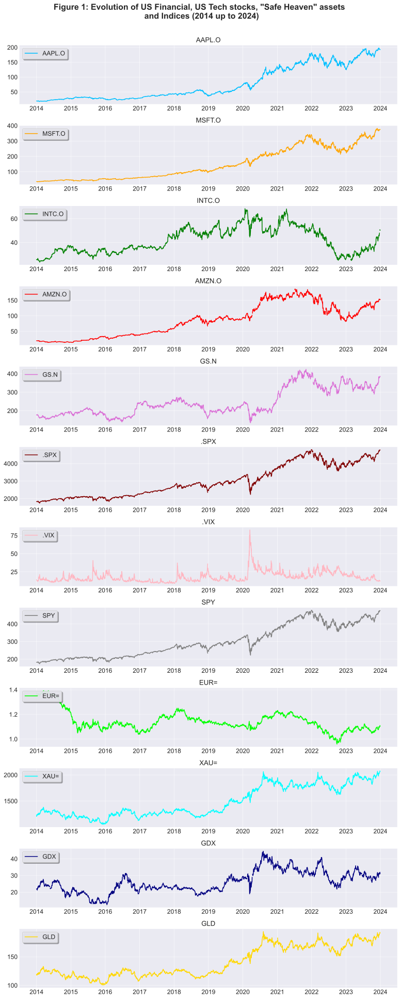

In [12]:
# Creates a 10x22 inch figure with 12 vertically stacked subplots, each in a single column.
fig, axes = plt.subplots(nrows=12, ncols=1, figsize=(11, 28), dpi=100)

# Plotting each column on its own subplot with assigned colors
for i, col in enumerate(raw.columns):
    axes[i].plot(raw.index, raw[col], label=col, color=color_map[col])
    axes[i].set_title(col)
    axes[i].grid(True)  # Adding grid for better readability
    axes[i].legend(frameon=True, framealpha=0.9, shadow=True, fancybox=True, loc='upper left')

# Adjusting layout
plt.tight_layout()
plt.subplots_adjust(top=0.92)
fig.suptitle('Figure 1: Evolution of US Financial, US Tech stocks, "Safe Heaven" assets \n and Indices (2014 up to 2024)', 
             fontsize=16, fontweight='bold',  y=0.96, horizontalalignment='center')
plt.savefig('Figure 1: Evolution of Assets.png', dpi=100)

plt.show()

## Statistical Analysis
We incorporate comprehensive statistical analysis to summarize and describe the main characteristics of the data set under study, including measures of central tendency, dispersion, and distribution properties. This can provide a deeper understanding of the underlying trends and patterns. Moreover, understanding these measures and properties is essential for analyzing data, as they help to summarize complex data sets with a few descriptive statistics, identify outliers, and understand the data's overall shape and spread.

### Univariate Analysis:
Univariate analysis will involve understanding and examining one (“uni") target feature and its potential signals, on their own and in relation to time. Univariate analysis will look for each features “range of values, as well as the central tendency of the values whilst also describing the pattern of the response to the variable. 

The next step in univariate analysis is using statistical summaries to capture characteristics of the data. Depending on whether the data is categorical or numeric, different statistical features or “sample statistics" can be used. Sample statistics help “express the central tendency of the data (arithmetic mean, median, mode), its spread (variance, standard deviation, inter-quartile range, maximum and minimum value) or some features of its distribution (skewness, kurtosis).

### Descriptive statistics summary
#### Statistical Summary 
As a starter, we consider the methods `info()` and `describe()` which provides a quick overview over imported financial time series data sets. We review the mean, median, standard deviation, and other statistical summaries. 

In [13]:
raw.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2608 entries, 2014-01-01 to 2023-12-29
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL.O  2516 non-null   float64
 1   MSFT.O  2516 non-null   float64
 2   INTC.O  2516 non-null   float64
 3   AMZN.O  2516 non-null   float64
 4   GS.N    2516 non-null   float64
 5   .SPX    2516 non-null   float64
 6   .VIX    2528 non-null   float64
 7   SPY     2516 non-null   float64
 8   EUR=    2608 non-null   float64
 9   XAU=    2600 non-null   float64
 10  GDX     2516 non-null   float64
 11  GLD     2516 non-null   float64
dtypes: float64(12)
memory usage: 264.9 KB


In [14]:
raw.describe().round(3)

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,.SPX,.VIX,SPY,EUR=,XAU=,GDX,GLD
count,2516.000,2516.000,2516.000,2516.000,2516.000,2516.000,2528.000,2516.000,2608.000,2600.000,2516.000,2516.000
mean,77.921,149.856,41.734,84.406,244.681,3005.886,18.136,300.164,1.143,1490.774,26.126,140.692
std,56.227,101.640,10.712,51.398,72.551,901.341,7.314,89.725,0.081,294.015,6.436,26.262
min,17.849,34.980,23.520,14.348,134.970,1741.890,9.140,174.170,0.959,1051.360,12.470,100.500
25%,29.804,55.692,32.990,36.371,189.140,2124.268,13.190,212.475,1.091,1245.360,21.810,118.930
50%,48.108,109.930,37.720,86.809,222.910,2798.160,16.110,279.310,1.126,1329.425,25.105,126.670
75%,134.562,243.008,50.610,127.122,313.875,3907.080,21.292,389.725,1.180,1794.406,30.682,167.775
max,198.110,382.700,68.470,186.570,423.850,4796.560,82.690,477.710,1.393,2077.159,44.530,193.890


#### Data Transformation
In this section, we perform data transformation tasks to prepare our dataset for further analysis.
SPX and SPY both track the S&P 500 index, essentially representing the same underlying asset. Therefore, analyzing both might lead to redundancy in terms of market insights and trading strategies. We choose to exclude the S&P 500 index data and keep the SPY ETF data.

In [15]:
# Exclude the '.SPX' related data
symbols = raw.columns
symbols_excluding_spx = symbols.drop('.SPX')
symbols_excluding_spx

Index(['AAPL.O', 'MSFT.O', 'INTC.O', 'AMZN.O', 'GS.N', '.VIX', 'SPY', 'EUR=',
       'XAU=', 'GDX', 'GLD'],
      dtype='object')

In [16]:
data = pd.DataFrame(raw[symbols_excluding_spx])
data

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,.VIX,SPY,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,
2014-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.3752,1205.2900,NaN,NaN
2014-01-02,19.754623,37.16,25.790,19.8985,176.89,14.23,182.920,1.3670,1224.5100,22.03,118.00
2014-01-03,19.320695,36.91,25.780,19.8220,178.15,13.76,182.885,1.3587,1236.1600,21.83,119.29
2014-01-06,19.426052,36.13,25.460,19.6815,179.37,13.55,182.360,1.3627,1237.5900,21.93,119.50
2014-01-07,19.287034,36.41,25.585,19.9015,178.29,12.92,183.480,1.3615,1231.4900,21.97,118.82
...,...,...,...,...,...,...,...,...,...,...,...
2023-12-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.1007,NaN,NaN,NaN
2023-12-26,193.050000,374.66,50.500,153.4100,381.61,12.99,475.650,1.1042,2066.6050,31.67,191.72
2023-12-27,193.150000,374.07,50.760,153.3400,384.48,12.43,476.510,1.1103,2077.1589,31.98,192.59


##### Data Cleaning: Handling missing data
We need to handle the missing values (NaN) at the start of our dataset. Depending on the analysis, we could fill them with appropriate values, drop them, interpolate or even more sophisticated ones like using machine learning models to predict the missing values. 

Depending on the nature of the missing data and our analysis, we might want to consider imputation, forward-fill, or back-fill strategies, especially if we plan to employ time-series forecasting models.
To address missing values, we use forward filling (.ffill()) followed by backward filling (.bfill()), which is a common technique in time series data to preserve the time series structure without introducing too much bias.

In [17]:
# Fill NA values with forward fill and back-filling 
# before calculating daily returns to handle any remaining NAs
data_filled = data.ffill().bfill()

Choosing the right approach depends on the specifics of our dataset and the assumptions we're willing to make about missing data. Dropping NA values can lead to loss of data, especially if NAs are sporadic and not clustered. Forward filling (or any other filling method) makes the assumption that the best guess for a missing value is the last observed value, which might not always be appropriate, depending on the nature of our data and analysis.

##### Data Integrity:
When filling missing data, we need to ensure that no future information is accidentally used in the process (look-ahead bias), which is a common pitfall in financial time series analysis.

**This transformation step is crucial as it ensures that our dataset is clean and suitable for the robust analysis that will follow.**

##### Color Map Redefinition: 
After excluding '.SPX', we redefine the color map for consistency in visualization.

In [18]:
# Defining a color map for the assets to keep consistency
color_map = {
    'AAPL.O': 'deepskyblue',
    'MSFT.O': 'orange',
    'INTC.O': 'green',
    'AMZN.O': 'red',
    'GS.N': 'orchid',
    '.VIX': 'lightpink',
    'SPY': 'gray',
    'EUR=': 'lime',
    'XAU=': 'cyan',
    'GDX': 'navy',
    'GLD': 'gold'
}

### Treatment of financial time series within analytical frameworks and modeling approaches
#### Levels vs Returns Forecasting
In financial time series analysis, choosing between absolute price data and relative return data is key. 


- Absolute price data captures actual asset prices over time but is less suited for statistical analysis due to its scale dependence. 

- Relative return data, transformed into either simple percentage changes or logarithmic (log) returns, standardizes comparisons across assets. 

Simple returns calculate the straightforward percentage change between periods, while log returns, preferred for their statistical properties like additivity and closer alignment with normal distribution, facilitate deeper analytical techniques and modeling. Due to the non-stationary behavior commonly observed in financial time-series, utilizing machine learning forecasting methods to predict their levels can frequently encounter future data points that lie beyond the distribution seen in the model's training data. Consequently, this often leads to a significant reduction in the efficacy of these models. 

Given the stochastic nature typically observed in financial time-series, forecasting in a probabilistic manner tends to yield more practical results compared to point-wise estimates. Hence, when dealing with financial time-series, quant practioners recommend to prioritize probabilistic forecasting of returns rather than focusing solely on prices or index levels.

We incorporate this idea in our analysis and forecasting approach (subsequent section) by providing probabilistic returns.

#### Logarithmic returns (Log returns) 
Log returns are especially advantageous for modeling and forecasting, offering a better approach to handling non-stationarity and applying statistical and machine learning models, making them more suitable for regression analysis, portfolio optimization, and risk management. 


Therefore, we’ll calculate log returns first before any further analysis takes place. 

To calculate the logarithmic return of an asset for a single period, you would use the formula:

$$
r_t = \ln\left(\frac{P_t}{P_{t-1}}\right)
$$

Here, $r_t$ is the logarithmic return at time $t$, $\ln$ represents the natural logarithm, $P_t$ is the price of the asset at time $t$, and $P_{t-1}$ is the price of the asset at the previous time period $t-1$. This formula captures the continuously compounded return over the period from $t-1$ to $t$.

In [19]:
# Calculate daily logarithmic returns for the DataFrame excluding '.SPX'
log_returns = np.log(data_filled / data_filled.shift(1))

# Drop the first row of NaN values which is a result of the shift operation 
# in return calculation
log_returns = log_returns.dropna()

# Display the first few rows of the log returns DataFrame
log_returns.head()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,.VIX,SPY,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,
2014-01-02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.005981,0.015821,0.000000,0.000000
2014-01-03,-0.022211,-0.006750,-0.000388,-0.003852,0.007098,-0.033587,-0.000191,-0.006090,0.009469,-0.009120,0.010873
2014-01-06,0.005438,-0.021359,-0.012490,-0.007113,0.006825,-0.015379,-0.002875,0.002940,0.001156,0.004570,0.001759
2014-01-07,-0.007182,0.007720,0.004898,0.011116,-0.006039,-0.047610,0.006123,-0.000881,-0.004941,0.001822,-0.005707
2014-01-08,0.006318,-0.018014,-0.006077,0.009726,0.000841,-0.003877,0.000218,-0.003016,-0.004705,-0.016522,-0.005909


**This transformation is a critical step that facilitates most of the subsequent time series analyses and modeling techniques. After ensuring the log returns are correctly calculated, we can proceed with more sophisticated analyses, such as volatility clustering, mean-reversion, and momentum strategies, or construct a covariance matrix for portfolio optimization for example.**
## Performance Metrics:
####  Relative Performance of Financial Instruments
Continuing with our statistical We calculate performance metrics like annualized returns, cumulative returns, and risk-adjusted returns (e.g., Sharpe ratio) to compare how each stock has performed relative to the others and to the market (SPY).

In [20]:
# Adjusting the calculation to compare the first and last data points
performance_ratio = data_filled.iloc[-1] / data_filled.iloc[0] - 1  # Subtracting 1 to get the actual performance change.iloc[-1] / data_filled.iloc[0] - 1  # Subtracting 1 to get the actual performance change

In [21]:
performance_ratio.dropna(inplace=True) 

In [22]:
# Sorting the performance ratios for better visualization
performance_ratio_sorted = performance_ratio.sort_values()

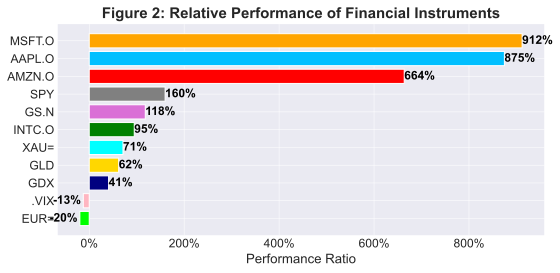

In [23]:
# Plotting bar charts about performance ratios 
plt.figure(figsize=(8, 4))
# Use color_map to get the corresponding colors, and use 'fuchsia' for any missing keys in color_map
bar_colors = [color_map.get(sym, 'fuchsia') for sym in performance_ratio_sorted.index]

bars = plt.barh(performance_ratio_sorted.index, performance_ratio_sorted, color=bar_colors)

# Format the x-axis to display percentages
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: '{:.0%}'.format(x)))

# Add annotations for the bars, displaying the performance ratio as a percentage
for bar in bars:
    width = bar.get_width()
    label_x_pos = bar.get_x() + width if width > 0 else bar.get_x() + width - 0.05
    plt.text(label_x_pos, bar.get_y() + bar.get_height()/2, f'{width:.0%}', 
             va='center', ha='right' if width < 0 else 'left', fontweight='bold', fontsize=12, color='black')

plt.xlabel('Performance Ratio')
plt.title('Figure 2: Relative Performance of Financial Instruments', fontsize=15, fontweight='bold')
plt.tight_layout()  # Tight layout should be before saving the figure.
plt.savefig('Figure 2: Relative_Performance_of_Financial_Instruments.png', dpi=100)
plt.show()

* Tech Stocks Outperformance: The chart clearly shows the significant outperformance of tech stocks, with MSFT.O and AAPL.O leading the pack with over 875% and 912% performance ratios, respectively.
* Market Index Performance: SPY, which tracks the S&P 500, shows a solid return, confirming its role as a general market benchmark.
* Commodities and "Safe Haven" Assets: Gold (GLD) and the Gold Miners ETF (GDX) show more modest returns, which may align with their roles as "safe haven" assets.
* Negative Performers: The VIX, which tends to rise when market volatility increases, shows a negative performance ratio, as does the EUR= currency pair, indicating a decrease relative to the USD over the period.

#### Risk-Adjusted Returns
We calculate Cumulative Returns distributions, Compound Annual Growth Rate (CAGR) and Sharpe Ratios and Excess Sharpe Ratios over SPY 

In [24]:
# Calculate performance metrics excluding .SPX
cumulative_returns = (1 + log_returns).cumprod() - 1
cagr = qs.stats.cagr(log_returns)
sharpe_ratios = qs.stats.sharpe(log_returns)
excess_returns = log_returns.sub(log_returns['SPY'], axis=0)
excess_sharpe_ratios = qs.stats.sharpe(excess_returns) * (252**0.5)

In [25]:
# Create a DataFrame to display the results
performance_summary = pd.DataFrame({
    'Cumulative Returns': cumulative_returns.iloc[-1],
    'CAGR': cagr,
    'Sharpe Ratios': sharpe_ratios,
    'Excess Sharpe Ratios over SPY': excess_sharpe_ratios
})

In [26]:
# Sort the DataFrame by 'Cumulative Returns' in ascending order for plotting
performance_summary_sorted = performance_summary.sort_values(by='Cumulative Returns')

In [27]:
display(performance_summary_sorted)

,Cumulative Returns,CAGR,Sharpe Ratios,Excess Sharpe Ratios over SPY
.VIX,-0.999538,-0.411662,-0.010468,-1.223452
GDX,-0.344329,-0.028737,0.086414,-2.394645
EUR=,-0.222714,-0.017254,-0.270691,-9.785071
INTC.O,0.138749,0.009016,0.201054,-1.799465
GS.N,0.463672,0.026665,0.271935,-1.436517
GLD,0.467005,0.026826,0.336738,-3.289814
XAU=,0.552798,0.030866,0.379014,-2.903977
SPY,1.221379,0.056682,0.532018,NaN
AMZN.O,3.414694,0.108024,0.604215,6.412570
AAPL.O,5.503921,0.138081,0.788817,10.714785


#### Risk-Free Rate Assumption Disclaimer: 
- *Risk-Free Rate Specification*: If not already accounted for, quants specify the risk-free rate used in the Sharpe ratio calculation. It should reflect the average yield of a risk-free asset (like the 3-month Treasury bill) over the period analyzed.
- For this programmatic project, we did not specified the risk-free rate used in the Sharpe ratio calculation.
- `risk_free_return`: 3-month treasury bill yield. It's updated daily. To get the latest yield, click [here](https://home.treasury.gov/policy-issues/financing-the-government/interest-rate-statistics?data=yield).

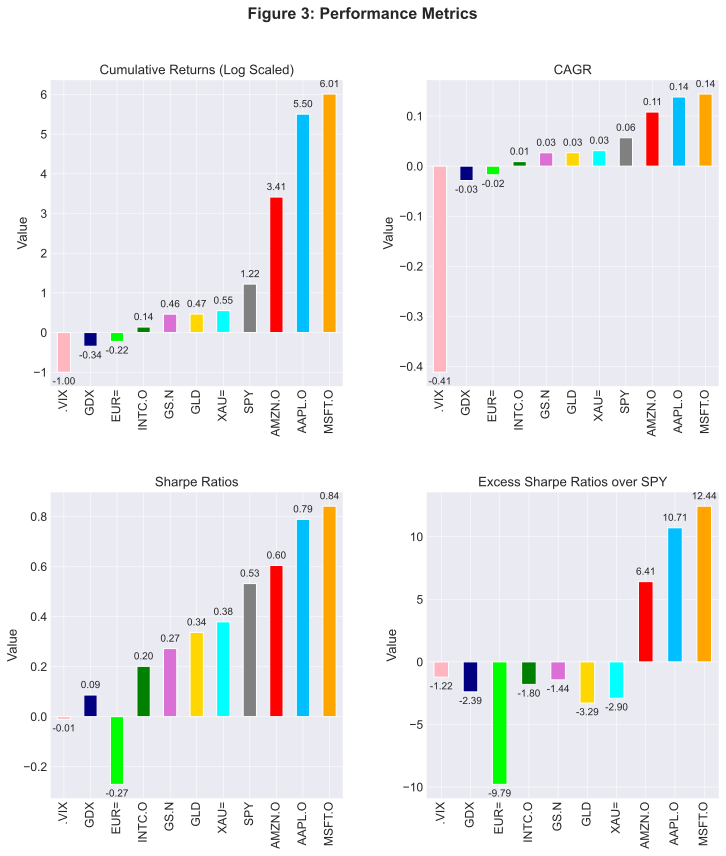

In [28]:
# Function to add value labels on the bars
def add_value_labels(ax, spacing=5, fontsize=10):
    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            space *= -1
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.2f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va,                      # Vertically align label differently for positive and negative values
            fontsize=fontsize)          # Set fontsize of the label
        

# Plotting each metric in a bar chart using the sorted and formatted summary
fig, axes = plt.subplots(2, 2, figsize=(11, 12), dpi=100)
axes = axes.flatten()

# Cumulative Returns
performance_summary_sorted['Cumulative Returns'].plot(kind='bar', ax=axes[0], color=[color_map.get(x, '#333333') for x in performance_summary_sorted.index])
axes[0].set_title('Cumulative Returns (Log Scaled)')
axes[0].set_ylabel('Value')
add_value_labels(axes[0])

# CAGR
performance_summary_sorted['CAGR'].plot(kind='bar', ax=axes[1], color=[color_map.get(x, '#333333') for x in performance_summary_sorted.index])
axes[1].set_title('CAGR')
axes[1].set_ylabel('Value')
add_value_labels(axes[1])

# Sharpe Ratios
performance_summary_sorted['Sharpe Ratios'].plot(kind='bar', ax=axes[2], color=[color_map.get(x, '#333333') for x in performance_summary_sorted.index])
axes[2].set_title('Sharpe Ratios')
axes[2].set_ylabel('Value')
add_value_labels(axes[2])

# Excess Sharpe Ratios over SPY
# Exclude 'SPY' from 'Excess Sharpe Ratios over SPY' for plotting
performance_summary_sorted_excess = performance_summary_sorted.drop('SPY', errors='ignore')
performance_summary_sorted_excess['Excess Sharpe Ratios over SPY'].plot(kind='bar', ax=axes[3], color=[color_map.get(x, '#333333') for x in performance_summary_sorted_excess.index])
axes[3].set_title('Excess Sharpe Ratios over SPY')
axes[3].set_ylabel('Value')
add_value_labels(axes[3])

# Adjust layout
fig.tight_layout(pad=3.0)
fig.suptitle('Figure 3: Performance Metrics', fontsize=16, fontweight='bold', y=1.02)

plt.savefig('Figure 3: Cumulative Returns, CAGR, and Sharpe ratios metrics', dpi=100)

plt.show()

#### <u> Key Takeaways:</u>  

Upon examining the provided data visualization of cumulative returns, CAGR, and Sharpe ratios, here are several precise and expert-level insights:
* Tech Sector Dominance: The disproportionate growth in tech stocks AAPL and MSFT suggests these companies have leveraged sector-specific advantages such as scalable business models and innovation-driven revenue streams. Considering their cumulative returns and CAGR, they appear to have sustained above-market performance over a considerable period, which could be attributed to consistent product development and market expansion strategies.
* Evaluating Market Sentiment: The high Sharpe ratios for AAPL and MSFT, in conjunction with their excess Sharpe ratios, imply not only strong returns but also effective risk management relative to the broader market. This could indicate that the market prices these stocks favorably, reflecting investor confidence in their future prospects. However, the excess Sharpe ratio's magnitude, especially for MSFT, warrants a closer look to assess if investor sentiment may have overly inflated expectations.
* Currency and Commodity Observation: Negative returns on the EUR and a modest performance from gold-related assets (XAU, GLD) contrast sharply with equity performance. This could be reflective of a strong equity market drawing investment away from traditional “safe havens” and may also indicate periods of a stronger USD. The negative performance of VIX suggests a stable, less volatile period for equities during the timeframe analyzed.
* Risk-Adjusted Perspective: The visualization underlines the importance of considering risk-adjusted returns. For instance, despite its high cumulative return, AMZN's Sharpe ratio is notably lower than AAPL's and MSFT's, suggesting a higher volatility or risk level taken to achieve those returns. An expert would likely delve deeper into the risk factors driving this discrepancy.
* Macro-Financial Environment: Given the timeline, it would be prudent to consider the impact of macro-financial forces such as monetary policy and its role in asset price inflation. Low-interest-rate environments typically boost equity valuations, and the end of such a period could alter the return landscape significantly.

In conclusion, the visualization provides a strong foundation for both descriptive and inferential analysis. A deeper dive could involve more sophisticated statistical tests, scenario analysis, and the use of predictive models to forecast future performance based on historical trends. We will explore these topics in subsequent sections.

# Stock markets data is “Not Normal"
Statisticians often point out that stock market data deviates from a normal distribution, showing a tendency towards skewness—usually towards higher returns for growth assets—and exhibiting fat tails, particularly on the downside, which suggests that extreme returns are more common than traditionally expected. This distinct behavior of market data challenges the accuracy of many models, leading to overconfident predictions that don't hold up. Consequently, a statistical model may appear to fit historical data well but underperform or fail when applied to live or real market conditions.
## Distribution Analysis: 
We perform a more detailed analysis of the distribution of returns. Since financial returns can be non-normal, let's examine the skewness and kurtosis to understand the tails of the distribution. This can provide insights into the tail risk of the investments. Financial data often exhibit heavy tails or skewness, which can be critical in risk management and model selection. Moreover, Distributed time series forecasting has the potential to drive significant improvements in efficiency, profitability, and sustainability, thanks to the power of deeper analysis with non- stationary and/or non-linear models.

## Statistical Distribution Properties:
These properties describe the overall shape and characteristics of the data distribution.

- **Skewness:** A measure of the asymmetry of the probability distribution of a real-valued random variable. Positive skew indicates a tail on the right side of the distribution, while negative skew indicates a tail on the left side.

- **Kurtosis:** A measure of the "tailedness" of the probability distribution. High kurtosis means more of the variance is due to infrequent extreme deviations, as opposed to frequent modestly sized deviations.
    - Greater than zero suggests a distribution with heavier tails and a sharper peak than the normal distribution (leptokurtic).
    - Less than zero suggests a distribution with lighter tails and a less sharp peak than the normal distribution (platykurtic).
    - Equal to zero would suggest a distribution with tails similar to the normal distribution (mesokurtic).
    
- **Normal Distribution (Gaussian distribution):** Describes a symmetrical, bell-shaped distribution where most of the observations cluster around the central peak and the probabilities for values further away from the mean taper off equally in both directions.

## Statistical Tests of Normality 
"The normality assumption with regard to the uncertain returns of financial instruments can be considered the most important distribution in finance and one of the major statistical building blocks of financial theory "(Hilpisch, 2018). A large number of important financial models, like modern or mean-variance portfolio theory (MPT) and the capital asset pricing model (CAPM), rest on the assumption that returns of securities are normally distributed. Python provides efficient statistical and graphical means to test whether time series data is normally distributed or not. This section presents approaches to test a given time series for normality of returns. 

### Histograms
**Figure 4** compares the frequency distribution of the simulated log returns with the probability density function of the normal distribution for each asset. It allows for a detailed assessment of the return distributions for each financial instrument, with a focus on their skewness and kurtosis. The histograms with overlaid normal distributions curves above display the distribution of daily log returns for each financial instrument or index, with each subplot dedicated to a different symbol. The use of 55 bins allows for a detailed view of the distribution of returns. This visualization is an excellent way to observe the actual distribution of returns against the theoretical normal distribution, which can give insights into the nature of the returns, such as skewness, kurtosis, and deviation from normality.

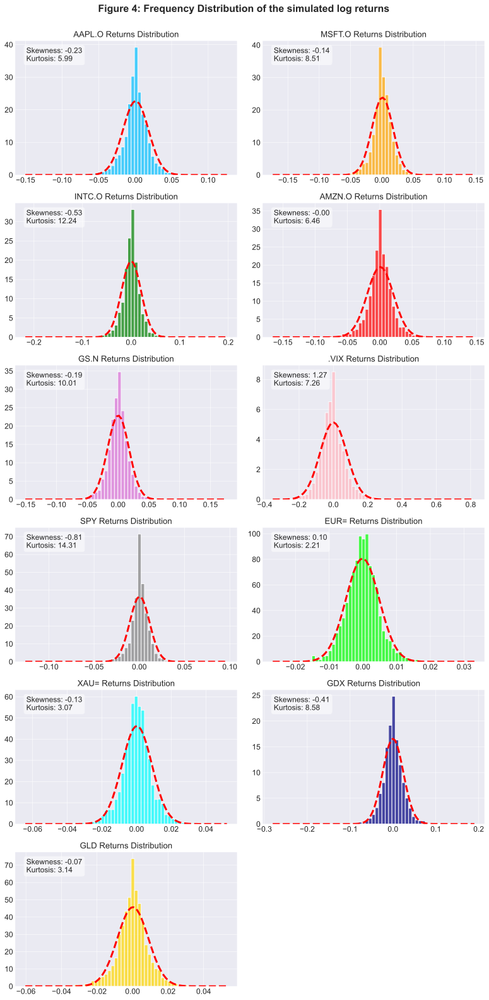

In [29]:
# Ensure that '.SPX' is not in the list of symbols
symbols = [symbol for symbol in log_returns.columns if symbol != '.SPX']

# Now proceed with your histogram plotting
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(11, 22))
axes = axes.flatten()  # Flatten the axes array for easy indexing

for i, symbol in enumerate(symbols):
    # Drop NaN values for the returns
    symbol_returns = log_returns[symbol].dropna()
    
    # Calculate the normal distribution fit
    mu, std = norm.fit(symbol_returns)
    
    # Calculate skewness and kurtosis
    symbol_skewness = skew(symbol_returns)
    symbol_kurtosis = kurtosis(symbol_returns)
    
    # Plot the histogram
    axes[i].hist(symbol_returns, bins=55, alpha=0.7, color=color_map.get(symbol, '#333333'), density=True)
    
    # Plot the normal distribution
    xmin, xmax = axes[i].get_xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    axes[i].plot(x, p, color='red', linestyle='--', linewidth=3)
    
    # Annotate with skewness and kurtosis
    textstr = f'Skewness: {symbol_skewness:.2f}\nKurtosis: {symbol_kurtosis:.2f}'
    axes[i].text(0.05, 0.95, textstr, transform=axes[i].transAxes, fontsize=12,
                 verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    # Set the title for each subplot
    axes[i].set_title(f'{symbol} Returns Distribution')

# If the number of symbols is less than the number of subplots, turn off the last axis
if len(symbols) < len(axes):
    axes[-1].axis('off')

# Set the overall title
fig.suptitle('Figure 4: Frequency Distribution of the simulated log returns ', fontsize=16, fontweight='bold', y=0.999)

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and show the plot
plt.savefig('Figure 4: Frequency Distribution of the simulated log returns.png', bbox_inches='tight', dpi=100)
plt.show()

The histograms of return distributions exhibit significant leptokurtosis and varied skewness across assets, indicative of non-normality which contravenes the basic premises of Modern Portfolio Theory. Specifically:
* AAPL.O and MSFT.O show negative skewness, suggesting a propensity for rapid drawdowns, a concern for strategies predicated on mean-variance optimization.
* VIX displays pronounced positive skewness, typical of volatility indices and reflective of the clustering of volatility and asymmetric shock absorption in portfolios.
* INTC.O presents extreme kurtosis, signaling the presence of fat tails and necessitating the use of tail-hedging strategies, perhaps via derivatives that exhibit positive convexity in tail events.
* GLD and XAU, with lower kurtosis, still diverge from mesokurtic distributions, which could implicate non-linear dependencies not captured by Pearson's correlation coefficient.

In summary, the visualizations underscore a need for advanced quantitative strategies that go beyond the Gaussian framework and embrace the realities of market imperfections and behavioral finance. An expert would use this detailed distributional information to refine investment decisions, optimize asset allocation, and ensure robustness in anticipating potential market shifts.

### Q-Q (quantile-quantile) plot
Comparing a frequency distribution (histogram) with a theoretical PDF is not the only way to graphically “test” for normality (Hilpisch, 2018). So-called quantile-quantile (QQ) plots are also well suited for this task where sample quantile values are compared to theoretical quantile values. The Q-Q plots are an excellent tool for assessing whether the distribution of returns fits a theoretical distribution, typically a normal distribution. 

To investigate further, we use the `statsmodels` package to create a Q-Q plot of the log returns,`log_returns`. Log returns are commonly used for this kind of plot in finance because financial returns are often log-normally distributed, making the log transformation a natural choice for normalization and comparison.

This kind of plot is useful for visually determining the normality of financial returns, which again, is an assumption in many financial models.

In [30]:
# Create a figure to hold all subplots
num_symbols = len(symbols)
num_rows = int(np.ceil(num_symbols / 2))  # Calculate the number of rows needed

fig, axes = plt.subplots(num_rows, 2, figsize=(11, num_rows * 4), dpi=100)
axes = axes.flatten()  # Flatten to 1D array for easy iteration

# Loop through each symbol and create a Q-Q plot
for i, symbol in enumerate(symbols):
    ax = axes[i]
    
    # Generate log returns for the Q-Q plot
    symbol_log_returns = log_returns[symbol].dropna()
    
    # Generate Q-Q plot with statsmodels
    sm.qqplot(symbol_log_returns, line='45', ax=ax, fit=True,
              markerfacecolor=color_map.get(symbol, 'blue'), marker='o', 
              markeredgecolor='k')  # 'k' for black edge color
    
    # Set title with the color specified in the color map
    ax.set_title(f'Q-Q Plot of Log Returns for {symbol}', color=color_map.get(symbol, 'black'))

# Turn off any excess subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout to prevent overlap
plt.tight_layout()

# Adjust subplot parameters to give specified padding
plt.subplots_adjust(top=0.9)  # Adjust top spacing to allow for title

# Set the overall title for the figure
fig.suptitle('Figure 5: Q-Q Plots of Log Returns', fontsize=16, fontweight='bold', y=0.95)

# Save the figure with high resolution before showing
plt.savefig('Figure 5: Q-Q (quantile-quantile) plot.png', bbox_inches='tight', dpi=100)

# Display the plot
plt.show()

#### <u>Here are some observations about the Q-Q plots for the log returns of each asset:</u>

 **General Trend**: Most of the Q-Q plots show that the log returns do not perfectly follow a normal distribution, as the points deviate from the line in the tails.

 The Q-Q plots reveal nuanced details about the return distributions of the financial instruments in question. Here’s a distilled analysis:
* AAPL.O: The plot shows a slight left skew (-0.23) with leptokurtic behavior (kurtosis of 5.99), suggesting infrequent but impactful negative returns. This could imply a risk of sudden downturns that traditional models might not fully capture.
* MSFT.O: Exhibits slight negative skewness and higher kurtosis (8.51) than AAPL.O, indicating more pronounced tail risk. This could be symptomatic of market responses to product cycle developments and merits careful option hedging to manage extreme event risks.
* INTC.O: With a kurtosis of 12.24, it exhibits significant leptokurtosis, indicating a higher-than-expected occurrence of outlier events. The negative skew (-0.53) suggests a skew towards more frequent large negative returns. This warrants the use of tail-hedging strategies and perhaps exploring skewness-adjusted models for risk management.
* AMZN.O: The negligible skewness but noticeable kurtosis (6.46) implies that while day-to-day returns are symmetric, the presence of outliers is higher than a Gaussian distribution would predict. This could reflect market reactions to e-commerce dynamics and warrants the use of robust risk measures like Conditional Value at Risk (CVaR).
* VIX: The positive skewness (1.27) aligns with the nature of volatility products, which tend to exhibit spikes—implying significant right-tail risk. For derivative traders, this suggests the potential profitability of long volatility strategies during periods expected to precede market turbulence.
* EUR=: A near-zero skewness and low kurtosis (2.21) indicate a distribution close to normal in the body but with fewer outliers than expected. This might suggest a stable forex environment or effective central bank interventions during the period analyzed.
* XAU= and GLD: The lower kurtosis compared to equities suggests less extreme behavior in returns, aligning with their roles as potential safe havens or hedges against market downturns.
* GDX: Negative skewness (-0.41) and high kurtosis (8.58) suggest the risk of negative shocks perhaps due to operational or commodity price risks within the mining sector.

 In summary, the Q-Q plots reveal that advanced quantitative methodologies that acknowledge and integrate non-normal distribution characteristics are essential for robust financial modeling, risk management, and strategic decision-making in contemporary finance.

# Volatility Measurement 
## Volatility Analysis: 
The time series plots for daily return distributions present clear volatility patterns and outlier events across different financial instruments. Volatility clustering is a common phenomenon in financial time series, and observing how volatility changes over time can provide insights into market dynamics.
**Figure 6** shows the variability of the log returns over the period of time under considerations where "volatility clusters" can be spotted. 
### Time Series Plots for Daily Return Distributions
The subplots below display the daily log returns distributions for each financial instrument or index. Each subplot corresponds to a different symbol, allowing us to observe the day-to-day volatility and trends in returns over time. This type of visualization is particularly useful for identifying periods of high volatility within each asset's historical performance. The annotations on the time series plots mark significant one-day losses and recoveries, aiding in the identification of extreme market movements or potential turning points.

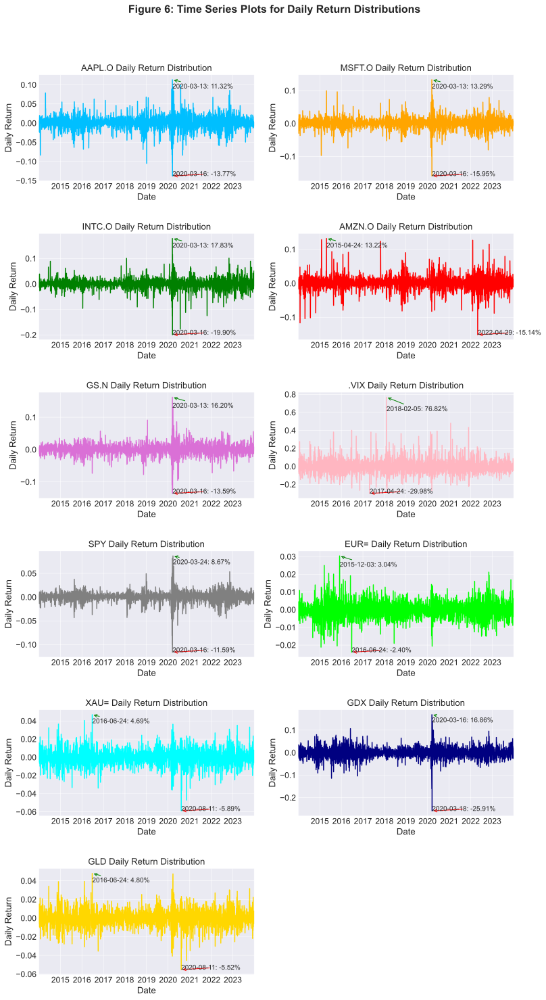

In [31]:
# Set up the subplots with 6 rows and 2 columns
num_rows = 6
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(11.5, num_rows * 4))

# Flatten the axes for easy iteration
axes = axes.flatten()

# Loop through each symbol and plot the log returns
for i, symbol in enumerate(log_returns.columns):
    ax = axes[i]
    
    # Plot the time series
    log_returns[symbol].plot(ax=ax, color=color_map.get(symbol, 'blue'))
    
    # Find the dates of the highest positive and lowest negative returns
    max_return = log_returns[symbol].idxmax()
    min_return = log_returns[symbol].idxmin()
    
    # Annotate the highest and lowest points
    ax.annotate(f'{max_return.strftime("%Y-%m-%d")}: {log_returns[symbol].max():.2%}',
                xy=(max_return, log_returns[symbol].max()),
                xytext=(max_return, log_returns[symbol].max() * 0.8),
                arrowprops=dict(arrowstyle="->", color='green'),
               fontsize=10)
    
    ax.annotate(f'{min_return.strftime("%Y-%m-%d")}: {log_returns[symbol].min():.2%}',
                xy=(min_return, log_returns[symbol].min()),
                xytext=(min_return, log_returns[symbol].min() * 1.0),
                arrowprops=dict(arrowstyle="->", color='red'),
                fontsize=10)
    
    # Title and labels
    ax.set_title(f'{symbol} Daily Return Distribution')
    ax.set_ylabel('Daily Return')

# Turn off any excess subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Add a main title for the entire figure
fig.suptitle('Figure 6: Time Series Plots for Daily Return Distributions', fontsize=16, fontweight='bold')

# Adjust the layout of the plots
fig.tight_layout()

# Adjust subplots to leave space for the main title and date labels
fig.subplots_adjust(top=0.92, hspace=0.5, bottom=0.15)


plt.savefig('Figure 6: Time Series Plots for Daily Return Distributions', bbox_inches='tight', dpi=100)

# Show the figure
plt.show()

#### <u>Key Insights:</u> 

* Equity Volatility: AAPL, MSFT, INTC, and AMZN show clusters of volatility, particularly during market-wide stress events, such as the early 2020 market crash attributed to the onset of the COVID-19 pandemic. The high volatility spikes in AAPL and MSFT, although short-lived, suggest a rapid market reassessment of risk premia during periods of uncertainty.
* Sector-Specific Reactions: INTC's pronounced single-day drops may reflect not only market-wide events but also sector-specific news, perhaps earnings announcements or supply chain disruptions, given the semiconductor industry's cyclical nature and recent supply constraints.
* Financial Sector Stability and Risk: GS.N shows a return profile with moderate volatility, consistent with a large financial institution's exposure to varied market conditions. However, the increased volatility around the same early 2020 period reflects the financial sector's sensitivity to economic shocks.
* Volatility Index Characteristics: VIX’s extreme spikes, especially the one in early 2018, affirm its nature as a market volatility barometer. These pronounced movements underscore the VIX’s role in portfolio hedging strategies, where it serves as a counterbalance to equity downturns.
* Currency Stability: The EUR= plot shows lower overall volatility, typical for major currency pairs, punctuated by a few notable spikes likely linked to critical policy changes or economic announcements within the Eurozone.
* Commodity Stability vs. Equity Volatility: XAU= and GLD exhibit lower volatility, consistent with gold's status as a safe-haven asset. However, the increase in volatility in early 2020 reflects a flight-to-quality behavior, where investors turn to gold during times of heightened market uncertainty.
* Mining Sector Leverage: GDX's higher volatility relative to XAU= and GLD likely reflects the leveraged nature of mining stocks to the price of gold, where operational and corporate factors amplify price movements.
From a quantitative finance perspective, these time series plots underscore the necessity for models that accommodate volatility clustering and asymmetric risk profiles, such as GARCH models for forecasting future volatility and jump-diffusion models for capturing the dynamics of sharp price movements. Additionally, the presence of significant outliers suggests the potential application of fat-tailed distributions in risk assessment.

### Box plots for visualization of daily returns






The box plot below displays the distribution of daily returns for a selection of assets, arranged horizontally for better visibility. This visualization helps identify the median, quartiles, and outliers within the daily returns data:

- The red central line in each box represents the median (50th percentile) of the daily returns. The edges of the box indicate the lower (25th percentile) and upper (75th percentile) quartiles, providing a sense of the spread or dispersion of the returns.
- The whiskers extend to show the range of the data, excluding outliers, which are determined as points lying beyond 1.5 times the interquartile range from the box's edges.
- Outliers are represented by individual points outside the whiskers, highlighting days with exceptionally high or low returns compared to typical values.
- This plot reveals the variability and risk associated with each asset, with wider boxes and longer whiskers indicating greater volatility.
- Outliers point to days of significant market moves, which could be driven by specific events or news impacting the asset or the market as a whole.

To summarize, this box plot provides a compact overview of the return distributions and can be used to quickly assess the risk (volatility) and return characteristics of these financial instruments.

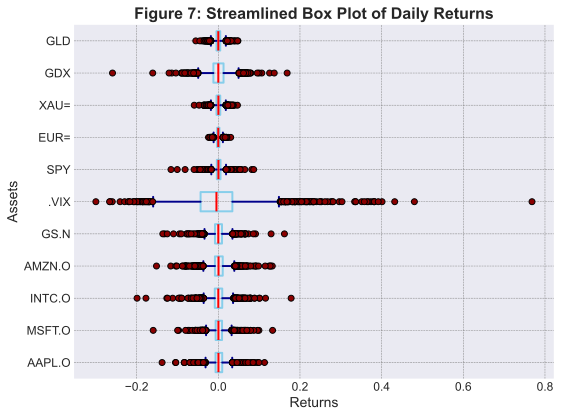

In [32]:
# Choose a simpler color scheme and reduce the number of customizations for clarity
box_props = dict(linewidth=2, color='skyblue')
whisker_props = dict(linewidth=2, linestyle='-', color='darkblue')
median_props = dict(linewidth=2, color='red')
cap_props = dict(linewidth=2, color='darkblue')

# Reducing the outlier customization for clarity
outlier_props = dict(marker='o', markerfacecolor='darkred', markersize=6, markeredgecolor='black')

fig, ax = plt.subplots(figsize=(8, 6))
log_returns.plot.box(ax=ax, vert=False, 
              flierprops=outlier_props,
              boxprops=box_props, 
              whiskerprops=whisker_props, 
              medianprops=median_props, 
              capprops=cap_props,
              widths=0.6)

# Streamlining the plot enhancements
ax.set_title('Figure 7: Streamlined Box Plot of Daily Returns', fontsize=16, fontweight='bold')
ax.set_xlabel('Returns', fontsize=14)
ax.set_ylabel('Assets', fontsize=14)
ax.grid(True, which='major', linestyle='--', linewidth=0.5, color='grey')
ax.tick_params(axis='x', which='major', labelsize=12)
ax.tick_params(axis='y', labelsize=12)

plt.savefig('Figure 7: box_plot_of_daily_returns.png', bbox_inches='tight', dpi=100)

plt.tight_layout()
plt.show()

* Equity Volatility: AAPL, MSFT, INTC, and AMZN show clusters of volatility, particularly during market-wide stress events, such as the early 2020 market crash attributed to the onset of the COVID-19 pandemic. The high volatility spikes in AAPL and MSFT, although short-lived, suggest a rapid market reassessment of risk premia during periods of uncertainty.
* Sector-Specific Reactions: INTC's pronounced single-day drops may reflect not only market-wide events but also sector-specific news, perhaps earnings announcements or supply chain disruptions, given the semiconductor industry's cyclical nature and recent supply constraints.
* Financial Sector Stability and Risk: GS.N shows a return profile with moderate volatility, consistent with a large financial institution's exposure to varied market conditions. However, the increased volatility around the same early 2020 period reflects the financial sector's sensitivity to economic shocks.
* Volatility Index Characteristics: VIX’s extreme spikes, especially the one in early 2018, affirm its nature as a market volatility barometer. These pronounced movements underscore the VIX’s role in portfolio hedging strategies, where it serves as a counterbalance to equity downturns.
* Currency Stability: The EUR= plot shows lower overall volatility, typical for major currency pairs, punctuated by a few notable spikes likely linked to critical policy changes or economic announcements within the Eurozone.
* Commodity Stability vs. Equity Volatility: XAU= and GLD exhibit lower volatility, consistent with gold's status as a safe-haven asset. However, the increase in volatility in early 2020 reflects a flight-to-quality behavior, where investors turn to gold during times of heightened market uncertainty.
* Mining Sector Leverage: GDX's higher volatility relative to XAU= and GLD likely reflects the leveraged nature of mining stocks to the price of gold, where operational and corporate factors amplify price movements.

From a quantitative finance perspective, these time series plots underscore the necessity for models that accommodate volatility clustering and asymmetric risk profiles, such as GARCH models for forecasting future volatility and jump-diffusion models for capturing the dynamics of sharp price movements. Additionally, the presence of significant outliers suggests the potential application of fat-tailed distributions in risk assessment.

# Multivariate Analysis:
When examining financial data, one of the most common methods to begin with is correlation analysis. It is worth noting that not all correlations are the same. Most of us are familiar with the Pearson and Spearman (rank order) approaches to correlations.
## Correlation Analysis: 
Given the diverse nature of financial instruments in our dataset, a correlation analysis could reveal interesting relationships between them, which is valuable for portfolio diversification and risk management. We calculate the correlation coefficients between the different stocks to understand their relationships. High positive correlation indicates that stocks move together, while a high negative correlation suggests they move inversely.
#### Correlation Matrix

In [33]:
c = raw.pct_change(fill_method=None).corr()
c

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,.SPX,.VIX,SPY,EUR=,XAU=,GDX,GLD
AAPL.O,1.000000,0.667889,0.516276,0.539356,0.480662,0.742179,-0.521502,0.742843,0.040042,0.009620,0.094889,0.019134
MSFT.O,0.667889,1.000000,0.579121,0.621057,0.493361,0.789121,-0.567102,0.785013,0.030755,0.002052,0.106982,0.012614
INTC.O,0.516276,0.579121,1.000000,0.402609,0.461658,0.657868,-0.470839,0.652695,0.026262,0.025359,0.105932,0.040807
AMZN.O,0.539356,0.621057,0.402609,1.000000,0.360100,0.610438,-0.467269,0.611151,0.064261,0.023214,0.115302,0.028213
GS.N,0.480662,0.493361,0.461658,0.360100,1.000000,0.749824,-0.541887,0.751101,0.042658,-0.107052,0.057788,-0.098105
.SPX,0.742179,0.789121,0.657868,0.610438,0.749824,1.000000,-0.718638,0.997212,0.077829,0.008834,0.170378,0.023067
.VIX,-0.521502,-0.567102,-0.470839,-0.467269,-0.541887,-0.718638,1.000000,-0.719096,-0.014268,0.052900,-0.101162,0.042140
SPY,0.742843,0.785013,0.652695,0.611151,0.751101,0.997212,-0.719096,1.000000,0.082514,0.005672,0.172435,0.019838
EUR=,0.040042,0.030755,0.026262,0.064261,0.042658,0.077829,-0.014268,0.082514,1.000000,0.375320,0.324042,0.381848
XAU=,0.009620,0.002052,0.025359,0.023214,-0.107052,0.008834,0.052900,0.005672,0.375320,1.000000,0.756145,0.985782


#### Correlation Matrix Heatmap
The heatmap of the correlation matrix provides a visual quantification of the linear relationship between the returns of various assets.
The heatmap is a powerful tool for displaying this information, with colors that help quickly identify the strength and direction of the correlations:
* Warm colors (e.g., red, orange) indicate positive correlations.
* Cool colors (e.g., blue) indicate negative correlations.
* The color intensity corresponds to the correlation strength.

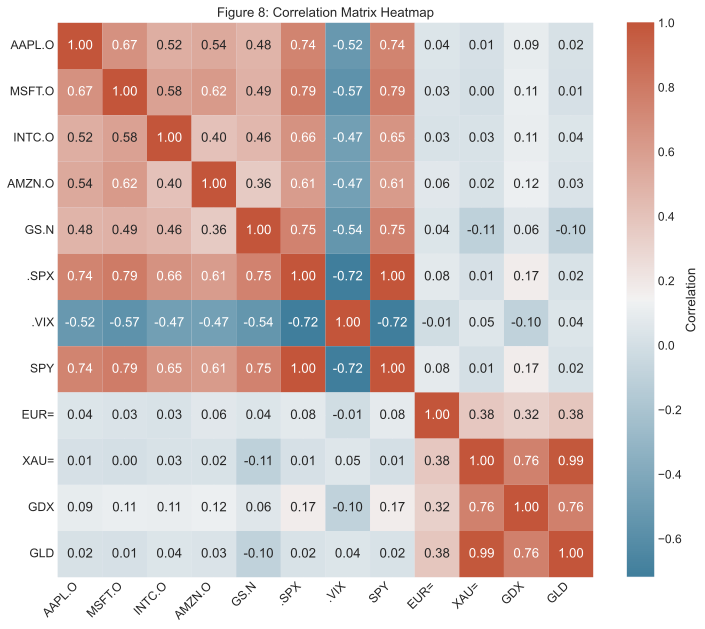

In [34]:
# Enhanced correlation matrix plot with annotations and improved readability
fig, ax = plt.subplots(figsize=(12, 10))
# Using a diverging colormap to distinguish positive and negative correlations
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Creating the heatmap with annotations
sns.heatmap(c, annot=True, fmt=".2f", cmap=cmap, cbar_kws={'label': 'Correlation'}, ax=ax)

# Improving the layout
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.title('Figure 8: Correlation Matrix Heatmap')

plt.savefig('Figure 8 :correlation_matrix.png', bbox_inches='tight', dpi=100)

plt.show()

#### <u>Correlation Insights:</u> 

* Tech Sector Correlation: AAPL, MSFT, INTC, and AMZN exhibit high positive correlations with each other, indicative of sectoral coherence. For a quant analyst, this suggests potential redundancy in diversification benefits within a tech-centric portfolio and could prompt the use of principal component analysis (PCA) to identify underlying factors driving returns.
* Market Benchmark Correlation: The strong positive correlation of individual equities with SPX (S&P 500 index) reflects the systemic market risk embodied in equity movements. A high correlation with SPX suggests these equities would not offer substantial diversification benefits in a portfolio dominated by market risk.
* VIX as a Market Fear Gauge: The negative correlations between VIX and equity indices (SPX and SPY) are in line with the VIX's role as a fear gauge. This inverse relationship is a foundation for protective strategies where VIX-based instruments could serve as hedges in an equity portfolio.
* Diversification with Commodities and Currencies: The low to negligible correlations of EUR=, XAU= (gold spot price), GDX (gold miners ETF), and GLD (gold-backed ETF) with equities suggest these assets could serve as diversifiers in a multi-asset portfolio. The near-perfect correlation between XAU= and GLD underscores that GLD is an effective proxy for gold spot price movements.
* Currency Pair Anomaly: The near-zero correlation of EUR= with equity assets could be of interest, particularly if this currency pair is being considered for hedging or as a non-correlated source of alpha in a quant strategy.
* Gold Miners Leveraged Play: GDX's correlation with XAU= indicates that while GDX does track the underlying metal's movements, it is not a perfect match, likely due to the operational leverage and company-specific risks inherent in mining stocks.

###  Classical (simple) case study: SPY and VIX inverse relationship 
The two subplots below show the historical data for the SPY ETF (`SPY`) and the CBOE Volatility Index `(.VIX)`. In the `SPY` plot (top), we can observe the general trend of the market, which shows fluctuations and a general upward trend over time until the cut-off point we're looking at. The `.VIX` plot (bottom), known as the "fear gauge," shows the market's expectation of volatility over the next 30 days. Periods with higher `.VIX` values typically correspond to higher uncertainty or fear in the market, which often coincides with lower or more volatile `SPY` values.

In [35]:
data_2 = raw[['SPY', '.VIX']]

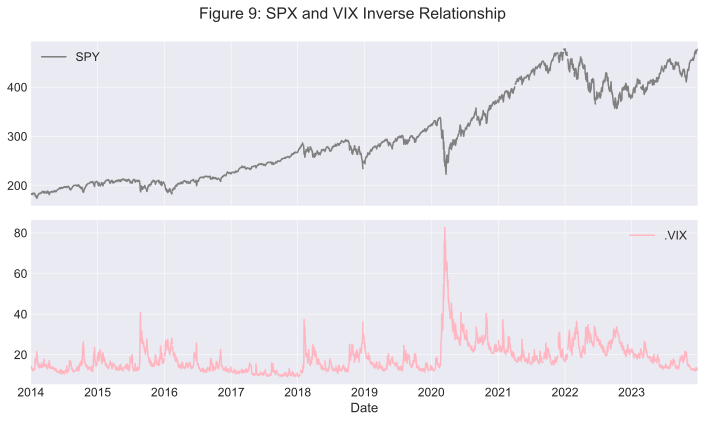

In [36]:
data_2[['SPY', '.VIX']].plot(subplots=True, figsize=(10, 6), color=[color_map['SPY'], color_map['.VIX']])

plt.suptitle('Figure 9: SPX and VIX Inverse Relationship')
plt.savefig('Figure 9: SPX_and_VIX_inverse_relationship.png', dpi=100)
plt.tight_layout()
plt.show()

**We quantitatively measure the relationship between .SPX and .VIX by calculating the correlation coefficient.**

In [37]:
# Correlation Analysis: 
c = data_2.pct_change(fill_method=None).corr()
c

,SPY,.VIX
SPY,1.000000,-0.719096
.VIX,-0.719096,1.000000


The output shows a correlation coefficient of approximately -0.720, which indicates a strong inverse relationship between the SPY ETF and the VIX index, suggesting that a significant portion of the movements in the VIX can be explained by movements in the S&P 500. This result is consistent with financial theory and empirical observations, as the VIX typically rises when the stock market is falling, reflecting increased investor fear, and tends to fall when the stock market is rising, reflecting increased investor confidence.

## Rolling Correlation between SPY and VIX

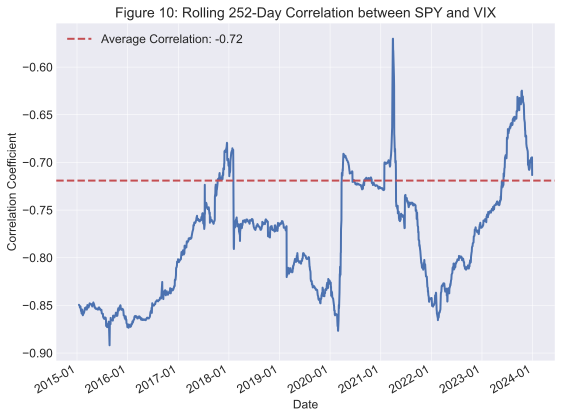

In [38]:
data_2['SPY_pct_change'] = data_2['SPY'].pct_change(fill_method=None)
data_2['.VIX_pct_change'] = data_2['.VIX'].pct_change(fill_method=None)

# Drop rows with NaN values in the percentage change columns
data_2_clean = data_2.dropna(subset=['SPY_pct_change', '.VIX_pct_change'])
# Calculate the rolling correlation
rolling_corr = data_2_clean['SPY_pct_change'].rolling(window=252).corr(data_2_clean['.VIX_pct_change'])

# Start the plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the rolling correlation
rolling_corr.plot(ax=ax, linewidth=2)

# Horizontal line for average correlation
average_corr = c.iloc[0, 1]  # c.corr() should be replaced with the appropriate DataFrame if different
ax.axhline(average_corr, c='r', linestyle='--', linewidth=2, label=f'Average Correlation: {average_corr:.2f}')

# Improve the visuals
ax.set_title('Figure 10: Rolling 252-Day Correlation between SPY and VIX', fontsize=14)
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Correlation Coefficient', fontsize=12)
ax.grid(True)
ax.legend(loc='best')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format the dates on x-axis

# Save the plot
plt.tight_layout()  # Adjust the padding between and around subplots
plt.savefig('Figure 10: Rolling 252-Day Correlation between SPY and VIX.png', dpi=100)
plt.show()  # Display the plot

**Figure 10** shows varying periods of correlation strength between SPY and VIX from 2015 to 2024. Stronger negative correlations, nearing -0.90, are evident in early 2015, late 2018 to early 2019, during the volatile market phase in early to mid-2020, and again from late 2023 to early 2024. Weaker negative correlations, closer to -0.65, are observed around mid-2018, mid-2021, and late 2022, with the coefficient rising above the average correlation level. These patterns suggest an inverse relationship that intensifies during market downturns and lessens in stable conditions. If our aim would be to model risk, the VIX can be a crucial component since it directly relates to market uncertainty and can be a predictor of turbulent times ahead. Is the trend towards stronger negative correlation evidenced in the chart above from late 2023 to pre- 2024 signaling a potential regime change in the VIX?
#### **Figure 11:** Visualization of the Relationship `SPY` and `.VIX`:
Let's use a scatter plot of the percentage change in `SPY` against the percentage change in the `.VIX`, rather than actual index values against each other, which help to visually represent this relationship. Given our focus on assessing dynamics, the percentage change approach seems appropriate, as it can more accurately reflect the relative sensitivity of the VIX to movements in the S&P 500, which is often a key consideration in trading and risk management strategies.

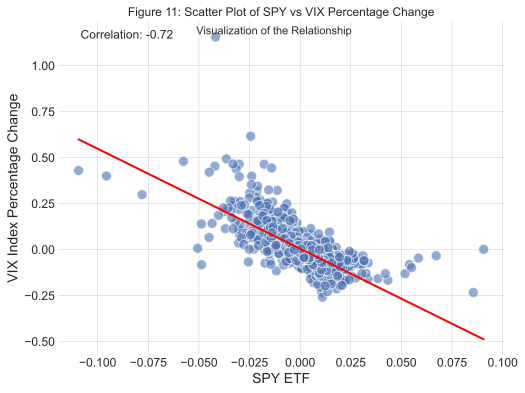

In [39]:
# Set the style of the visualization
sns.set_style('whitegrid')

# Create a scatter plot
plt.figure(figsize=(8, 6))
scatter = plt.scatter(data_2_clean['SPY_pct_change'], data_2_clean['.VIX_pct_change'], alpha=0.6, edgecolors='w', s=100)

# Label the axes with larger fonts
plt.xlabel('SPY ETF', fontsize=14)
plt.ylabel('VIX Index Percentage Change', fontsize=14)

# Add a title and a subtitle
plt.title('Figure 11: Scatter Plot of SPY vs VIX Percentage Change', fontsize=12)
plt.suptitle('Visualization of the Relationship', fontsize=11, y=0.87)

# Fit a polynomial of degree 1 (linear fit) to the cleaned data
m, b = np.polyfit(data_2_clean['SPY_pct_change'], data_2_clean['.VIX_pct_change'], 1)

# Add the trend line to the scatter plot
plt.plot(data_2_clean['SPY_pct_change'], m*data_2_clean['SPY_pct_change'] + b, color='red', linewidth=2)

# Add the correlation coefficient to the plot
corr_coef = np.corrcoef(data_2_clean['SPY_pct_change'], data_2_clean['.VIX_pct_change'])[0, 1]
plt.annotate(f'Correlation: {corr_coef:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12)

plt.savefig('Figure 11: Scatter Plot of SPY vs VIX Percentage Change', dpi=100)

# Show the plot
plt.show()

The scatter plot image depicts the percentage change in the SPY versus the percentage change in the VIX Index. The data points are represented as blue dots, and a red line indicates the trend of the relationship between the two variables. The negative slope of the red trend line visually reinforces the negative correlation, and the data points are spread out in a way that suggests a clear inverse relationship, providing support for the **stylized (empirical) fact** about the negative correlation between the VIX Index and the SPY.

> It is important to note that often times correlations between variables is mistaken as causation. <u>Whilst causation implies correlation **["correlation does not imply causation"](https://otexts.com/fpp2/causality.html)**.</u>
> 
> The paper ["Causal Factor Investing"](https://papers.ssrn.com/sol3/papers.cfm?abstract_id=4205613) by Marcos M. López de Prado (2023) explores the advancement of factor investing towards a scientific discipline through the application of causal inference. The author criticizes the prevalent approach in the factor investing literature that relies heavily on associational claims without proper consideration of the causal mechanisms behind factor models. The author proposes a framework for causal factor investing, which includes discovering the causal graph of the data-generating process and applying do-calculus to avoid under or over-controlling for variables.
> 
> Unlike traditional statistical analysis, which often focuses on correlation or association, causal discovery seeks to uncover the directionality and nature of causation among variables. This approach not only promises to enhance the robustness and reliability of investment strategies but also contributes to a more scientifically grounded practice in financial modeling and investment management. By prioritizing causality (causal inference) over correlation (traditional statistical methods that prioritize explanatory power), investors and practitioners can develop strategies that are more likely to withstand the test of time and changing market conditions.
> 
> The reference to López de Prado (2023) suggests this perspective is aligned with recent academic contributions and advanced practices in quantitative finance and data science, advocating for a deeper understanding and importance of causal reasoning within financial data. The call is for a shift away from maximizing explanatory power towards ensuring models are causally valid. This involves rigorous testing and validation of the causal assumptions underlying factor models. 

# Trend Analysis
### Rolling Statistics 
The most dominant form of analysis in stock trading/investing is the study of price action or technical analysis; which is the analysis of price signals, charts and indicators to extract information, patterns and probabilities with respect to the supply and demand balance over time. Technical indicators are usually employed to generate buy or sell signals based on observed patterns. This approach often places less relative emphasis on asset fundamentals, and instead focuses on the distillation of all known information into one metric: price. Recently, researchers have focused on technical indicators with machine learning algorithms to predict the price of stocks, ETFs, commodities and other assets. For the training of our models, we will particulary focus on trend-following (also referred to in academic circles as time-series momentum) which has actively been on investors’ radar for the last few decades. The following momentum-based measures are included in the present study:

Here is a list of the ones we are interested:
- #### [Simple Moving Averages (SMAs)](https://www.investopedia.com/terms/s/sma.asp)
- #### [Relative Strength Index](https://www.investopedia.com/terms/r/rsi.asp)
- #### [MACD Indicator](https://www.investopedia.com/trading/macd/)
- #### [Stochastic RSI](https://www.investopedia.com/terms/s/stochrsi.asp)

In [40]:
data= pd.read_csv(url, index_col=0, parse_dates=True)

In [41]:
data.dropna(inplace=True)

In [42]:
symbols = data.columns
symbols

Index(['AAPL.O', 'MSFT.O', 'INTC.O', 'AMZN.O', 'GS.N', '.SPX', '.VIX', 'SPY',
       'EUR=', 'XAU=', 'GDX', 'GLD'],
      dtype='object')

In [43]:
symbols_excluding_spx = symbols.drop('.SPX')
symbols_excluding_spx

Index(['AAPL.O', 'MSFT.O', 'INTC.O', 'AMZN.O', 'GS.N', '.VIX', 'SPY', 'EUR=',
       'XAU=', 'GDX', 'GLD'],
      dtype='object')

In [44]:
data = pd.DataFrame(data[symbols_excluding_spx])

In [45]:
indicators = pd.DataFrame(index=data.index)

In [46]:
# Calculate SMAs, RSI, MACD and Stoch RSI for each symbol using pandas_ta
for symbol in symbols_excluding_spx:
    # Calculate SMAs for 50, 100, and 200 periods using pandas_ta
    indicators[f'{symbol}_SMA_50'] = ta.sma(data[symbol], length=50)
    indicators[f'{symbol}_SMA_100'] = ta.sma(data[symbol], length=100)
    indicators[f'{symbol}_SMA_200'] = ta.sma(data[symbol], length=200)

    # Calculate RSI using pandas_ta
    indicators[f'{symbol}_RSI_14'] = ta.rsi(data[symbol], length=14)

    # Calculate MACD using pandas_ta and assign the results to the indicators DataFrame
    macd = ta.macd(data[symbol], fast=12, slow=26, signal=9)
    indicators[f'{symbol}_MACD'] = macd['MACD_12_26_9']
    indicators[f'{symbol}_MACD_signal'] = macd['MACDs_12_26_9']
    indicators[f'{symbol}_MACD_hist'] = macd['MACDh_12_26_9']

    # Calculate StochRSI using pandas_ta and assign the results to the indicators DataFrame
    stochrsi = ta.stochrsi(data[symbol], length=14, rsi_length=14, k=3, d=3)
    indicators[f'{symbol}_STOCHRSI_k'] = stochrsi['STOCHRSIk_14_14_3_3']
    indicators[f'{symbol}_STOCHRSI_d'] = stochrsi['STOCHRSId_14_14_3_3']

In [47]:
# print(indicators.columns)

In [48]:
# Now join the indicators DataFrame with the original data
data = pd.concat([data, indicators], axis=1)

In [49]:
# data

In [50]:
# Focus on the last 500 days of data
data_last_500 = data.iloc[-500:]

In [51]:
def plot_indicators(data, symbol, color_map):
    
    # Create a grid layout: 4 rows, 1 column
    fig = plt.figure(figsize=(14, 8))
    fig.suptitle(f'Figure 12: Technical Analysis for {symbol}', fontsize=16)  # Title for the entire figure
    ax1 = plt.subplot2grid((10, 1), (0, 0), rowspan=4, colspan=1)
    ax2 = plt.subplot2grid((10, 1), (4, 0), rowspan=2, colspan=1, sharex=ax1)
    ax3 = plt.subplot2grid((10, 1), (6, 0), rowspan=2, colspan=1, sharex=ax1)
    ax4 = plt.subplot2grid((10, 1), (8, 0), rowspan=2, colspan=1, sharex=ax1)  # New subplot for StochRSI

    # Plot the closing price and SMAs on the main chart
    ax1.plot(data_last_500.index, data_last_500[symbol], label=f'{symbol} Close Price', color=color_map[symbol])
    ax1.plot(data_last_500.index, data_last_500[f'{symbol}_SMA_50'], label='SMA 50', color='orangered')
    ax1.plot(data_last_500.index, data_last_500[f'{symbol}_SMA_100'], label='SMA 100', color='yellow')
    ax1.plot(data_last_500.index, data_last_500[f'{symbol}_SMA_200'], label='SMA 200', color='darkblue')
    ax1.set_title(f'{symbol} Price and Indicators')
    ax1.legend(loc='upper left')

    # Plot RSI on the second subplot
    ax2.plot(data_last_500.index, data_last_500[f'{symbol}_RSI_14'], label='RSI 14', color='black')
    ax2.axhline(70, color='darkred', linestyle='--')
    ax2.axhline(30, color='darkgreen', linestyle='--')
    ax2.fill_between(data_last_500.index, data_last_500[f'{symbol}_RSI_14'], 70, where=(data_last_500[f'{symbol}_RSI_14']>=70), facecolor='red', edgecolor='red', alpha=0.5)
    ax2.fill_between(data_last_500.index, data_last_500[f'{symbol}_RSI_14'], 30, where=(data_last_500[f'{symbol}_RSI_14']<=30), facecolor='green', edgecolor='green', alpha=0.5)
    ax2.set_title('Relative Strength Index')
    ax2.legend(loc='upper left')

    # Plot MACD on the third subplot
    ax3.plot(data_last_500.index, data_last_500[f'{symbol}_MACD'], label='MACD', color='black')
    ax3.plot(data_last_500.index, data_last_500[f'{symbol}_MACD_signal'], label='Signal', color='plum')
    ax3.bar(data_last_500.index, data_last_500[f'{symbol}_MACD_hist'], label='Hist', color='grey', width=0.5)
    ax3.set_title('MACD Indicator')
    ax3.legend(loc='upper left')

    # Plot StochRSI on the fourth subplot
    ax4.plot(data_last_500.index, data_last_500[f'{symbol}_STOCHRSI_k'], label='StochRSI %K', color='darkblue')
    ax4.plot(data_last_500.index, data_last_500[f'{symbol}_STOCHRSI_d'], label='StochRSI %D', color='salmon')
    ax4.axhline(80, color='darkred', linestyle='--')
    ax4.axhline(20, color='darkgreen', linestyle='--')
    ax4.set_title('Stochastic RSI')
    ax4.legend(loc='upper left')

    plt.tight_layout()
    plt.savefig('Figure 12:Technical Analysis.png', dpi=100)
    plt.show()

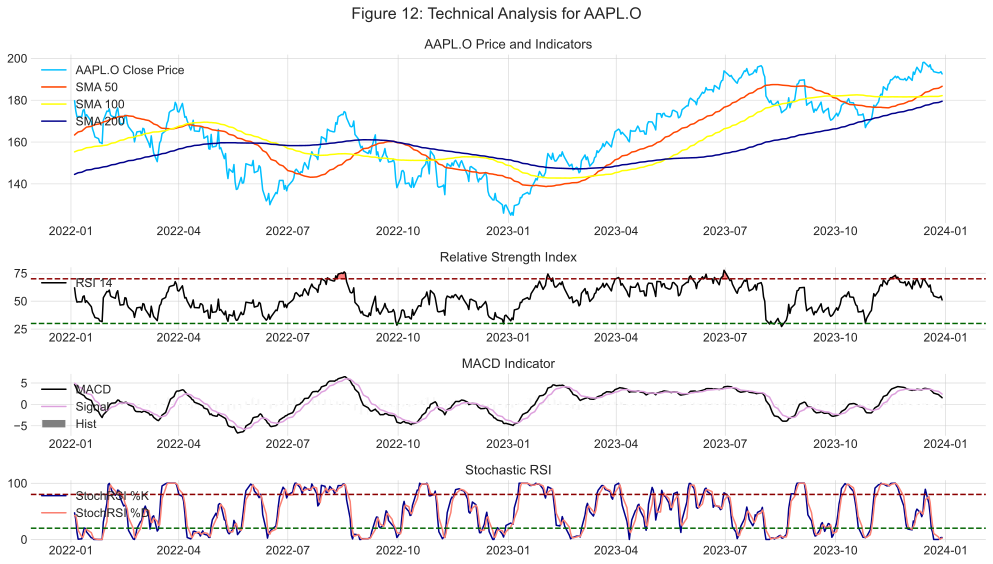

In [52]:
# Assuming 'data' DataFrame contains the required indicators for 'AAPL.O'
symbol = 'AAPL.O'

plot_indicators(data_last_500, symbol, color_map)

In [53]:
# commentary about investment strategies using technical indicators

# Introduction to Machine Learning & AI
In the dynamic field of **Machine Learning**, which intersects with **Statistics** and **Computer Science**, there has been remarkable advancement in handling and interpreting large, complex datasets. This progress is foundational for developing sophisticated trading strategies and understanding patterns within vast amounts of unstructured data. Machine Learning not only includes Classical Machine Learning techniques, akin to evolved forms of statistics, but is also increasingly focused on leveraging **Deep Learning** and **Reinforcement Learning**. Deep Learning employs intricate neural networks to delve deeper into data analysis, while Reinforcement Learning empowers algorithms to autonomously discover and optimize profitable strategies (Hilpisch, forthcoming). These cutting-edge methodologies are revolutionizing investment strategies and data analysis, providing deeper insights and innovative solutions for complex challenges. 

For more informatio on these topics, please refer to the bibliography.

## Machine Learning Methods
Methods of Machine Learning can be used to analyse more efficiently traditional datasets. 

> - In **Machine Learning**, the process involves feeding the computer a set of inputs (variables and datasets) along with corresponding outputs, which are the results of the inputs. The computer then "learns" to identify a rule that connects these inputs and outputs. The true test of this learning process is its performance on 'out of sample' data - its capacity to apply the learned relationship between variables to make predictions in new, unseen scenarios.
> - Machine Learning can be categorized into supervised or unsupervised. In **Supervised Learning** waims to discover a rule or an "equation" for predicting an outcome based on input variables. In contrast, **Unsupervised Learning++ seeks to reveal the underlying structure of data, such as identifying the principal factors driving market returns.

> - **Deep Learning** is a subset of Machine Learning, delves into data analysis through multiple layers of abstraction. It begins by understanding simple concepts and gradually combines them to grasp more complex and abstract ideas. Deep Learning mimics the way humans learn, representing a step towards replicating human intelligence artificially.

# Unsupervised Learning | Principal Component Analysis (PCA)
### Isolating Market Return Factors with PCA in Python 
> Principal Component Analysis is a widely used statistical technique to transform data into its orthogonal (linearly uncorrelated) components. We can use PCA exposures in-place of raw data in most clustering algorithms and it is ideal when using a clustering algorithm that can only use two dimensional data.
> This section is about using Principal Component Analysis (PCA) to analyze asset returns and its role in reducing dataset dimensions. It showcases applications in identifying and leveraging statistical return drivers within returns for the potential development of trading strategies:
> - *Objective 1:* To isolate market return factors using PCA, which is a technique that identifies the underlying factors driving returns in a dataset. PCA is commonly used for factor investing and risk management. We will explore additional unsupervised learning techniques, such as clustering, to complement the PCA findings.
> - *Objective 2:* The visualization blocks are expected to plot the outcomes of the PCA, such as the variance explained by each principal component and the loadings of the original variables on the principal components.
> - *Analysis:* The visualizations aim to help interpret the principal components, understand how much variance each component explains, and how the original features contribute to these components. This step is crucial for isolating and understanding market return factors (alpha factors).
> - *Alpha Factors Isolation:* By analyzing the components, we can identify and isolate factors that offer potential for abnormal returns, also known as alpha. It's essential to consider the economic rationale behind these factors to ensure they're actionable and not just statistical artifacts.
> - *Integration with Investment Strategy:* Incorporate the identified factors into quantitative models, risk management frameworks, or investment strategies. Testing their predictive power and economic significance is crucial before implementation.

The value of PCA in finance largely depends on the interpretability and actionability of the identified components. It's not just about reducing dimensionality but also about uncovering meaningful patterns that can inform investment decisions.

### Step 1: Data gathering

In [54]:
data= pd.read_csv(url, index_col=0, parse_dates=True)

Incorporating the VIX into PCA analyses hinges on the study's objectives, striking a balance between capturing market sentiment and maintaining analytical precision. The VIX, as a volatility proxy, enriches the dataset by offering insights into market fear and diversification opportunities, essential for comprehensive risk models. However, its distinct nature as implied volatility and potential to disproportionately influence outcomes necessitates caution, particularly when the focus is on asset return correlations. Ultimately, the decision to include the VIX should align with the analytical aims—enhancing understanding of market dynamics for broader analyses or excluding it for focused studies on return interactions. 

This discernment is crucial in tailoring the analysis to meet the precise objectives of financial market research or investment strategy development.

**Reasons to Exclude VIX:**

- *Different Nature of Data:* The VIX is a measure of implied volatility based on S&P 500 index options, not a price or return like the other assets in our dataset. Its inclusion could potentially skew the PCA results if our main interest is in the correlations of asset returns.

- *Outlier Influence:* Because the VIX can behave differently from asset prices (particularly equities), it might have an outsized influence on the PCA results, dominating one or more components in ways that are not useful for our analysis.

Since our primary focus is on the return correlations and interactions of tradable assets, and because we want to reduce the potential skew from a non-return-based metric like the VIX, we opt for excluding it from the PCA.

In [55]:
symbols = data.columns.drop(['.SPX','.VIX'])

In [56]:
data = pd.DataFrame(data[symbols])

#### Assets daily returns: 
Since we have already calculated daily returns for these assets, we can then apply PCA to analyze the principal components of the returns, which can help identify the main factors driving the variations in these returns.

In [57]:
asset_returns = data.pct_change(fill_method=None).dropna()
asset_returns

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,
2014-01-03,-0.021966,-0.006728,-0.000388,-0.003845,0.007123,-0.000191,-0.006072,0.009514,-0.009079,0.010932
2014-01-06,0.005453,-0.021132,-0.012413,-0.007088,0.006848,-0.002871,0.002944,0.001157,0.004581,0.001760
2014-01-07,-0.007156,0.007750,0.004910,0.011178,-0.006021,0.006142,-0.000881,-0.004929,0.001824,-0.005690
2014-01-08,0.006338,-0.017852,-0.006058,0.009773,0.000841,0.000218,-0.003011,-0.004694,-0.016386,-0.005891
2014-01-09,-0.012772,-0.006432,-0.004719,-0.002264,-0.005828,0.000654,0.002357,0.001452,-0.015733,0.002878
...,...,...,...,...,...,...,...,...,...,...
2023-12-21,-0.000770,0.007879,0.028846,0.011307,0.008079,0.009482,0.006400,0.008035,0.018519,0.007071
2023-12-22,-0.005548,0.002784,0.019541,-0.002730,0.000210,0.002010,0.000182,0.003657,0.006699,0.004434
2023-12-27,0.000518,-0.001575,0.005149,-0.000456,0.007521,0.001808,0.005524,0.005107,0.009788,0.004538


### Step 2: Fit a PCA model
With the daily returns calculated for each asset in the dataset, we're now ready to apply PCA to analyze the principal components. This process will help us understand the major factors that drive the variation in returns across these assets. Let's proceed with fitting a PCA model to these returns. 

We'll start by deciding on the number of components to extract, which is often chosen based on the explained variance ratio or simply set to a fixed number for initial analysis

In [58]:
# Initialize PCA and set the number of components to analyze
pca = PCA(n_components=3)
pca.fit(asset_returns)

PCA(n_components=3)

In [59]:
# Returns a vector of explained variance by each component 
pct = pca.explained_variance_ratio_

In [60]:
# Get the influence each component has on the features
pca_components = pca.components_

### Step 3: Visualization of the components
The chart on the left hindsight of **Figure 13** shows the contribution of the top three components toward the total variance. The PCA analysis reveals that the first component explains approximately ~45% of the variation in the returns data. The chart on the right hindsight of **Figure 13** is the cumulative explained variance (cumulative sum of the contribution) by different numbers of components, which helps to make an informed decision. The cumulative explained variance ratio achieved by the third principal component is at around 80%. 

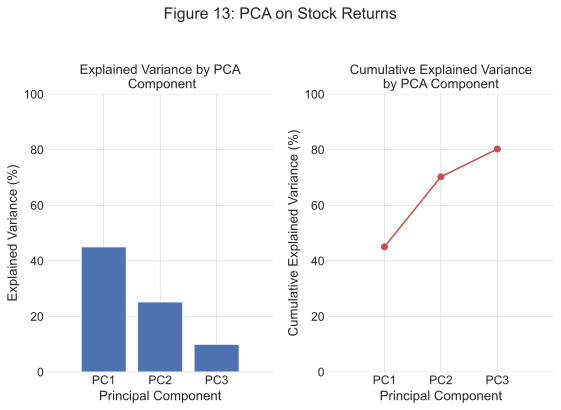

In [61]:
# Plotting
# Calculate the cumulative explained variance
cum_pct = np.cumsum(pct)
x = np.arange(1, len(pct)+1,1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 6))  # Create a figure and a set of subplots

# Contribution plot
ax1.bar(x, pct * 100, align="center")
ax1.set_title('Explained Variance by PCA\n Component')  # Set title for the subplot
ax1.set_xlabel('Principal Component')  
ax1.set_ylabel('Explained Variance (%)')  # Set y-axis label
ax1.set_xticks(x)
ax1.set_xticklabels(['PC1', 'PC2', 'PC3'])  # Setting custom x-tick labels
ax1.set_xlim([0, len(pct)+1])
ax1.set_ylim([0, 100])

# Cumulative contribution plot
ax2.plot(x, cum_pct * 100, 'ro-')
ax2.set_title('Cumulative Explained Variance\nby PCA Component')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Cumulative Explained Variance (%)')  # Set y-axis label
ax2.set_xticks(x)
ax2.set_xticklabels(['PC1', 'PC2', 'PC3'])  # Setting custom x-tick labels
ax2.set_xlim([0, len(pct)+1])
ax2.set_ylim([0, 100])

fig.suptitle('Figure 13: PCA on Stock Returns')  # Set an overall title for the plot

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
fig.savefig('Figure 13: PCA on Stock Return.png')

plt.show()   

In finance, a cumulative explained variance ratio of approximately 75-90% achieved by the first two or three principal components is considered a robust outcome in principal component analysis (PCA). This level of explained variance indicates that a significant proportion of the dataset's total variance is captured by a small number of components, effectively reducing dimensionality while retaining critical information.

Given this analysis, we might focus on the first few components for further investigation or interpretation, such as examining the composition of these components to understand what market movements or risks they might be capturing. 

### Component Loadings
To explore the compositions of the principal components, particularly the first few components since they explain most of the variance, we'll look at the loadings of each variable on these components. Loadings are the correlation coefficients between the original variables and the principal component. These loadings will tell us how each asset contributes to the component, helping us interpret the factors represented by the components. These loadings can help interpret the components in terms of original features to understand what specific factors (like market trends, sector influences, etc.) they represent. Let's examine the loadings for the first three principal components, which combined explain a significant portion of the variance in the portfolio returns.

In [62]:
original_features = asset_returns.columns.tolist()

             PC1       PC2       PC3
AAPL.O  0.277167 -0.045030  0.017550
MSFT.O  0.280754 -0.043207  0.029088
INTC.O  0.303727 -0.041267 -0.178190
AMZN.O  0.305277 -0.034634  0.233945
GS.N    0.230377 -0.057379 -0.108581
SPY     0.195457 -0.020245 -0.021033
EUR=    0.010428  0.033299  0.001616
XAU=    0.019831  0.140229  0.002643
GDX     0.130747  0.448257 -0.009926
GLD     0.022284  0.141696  0.001165


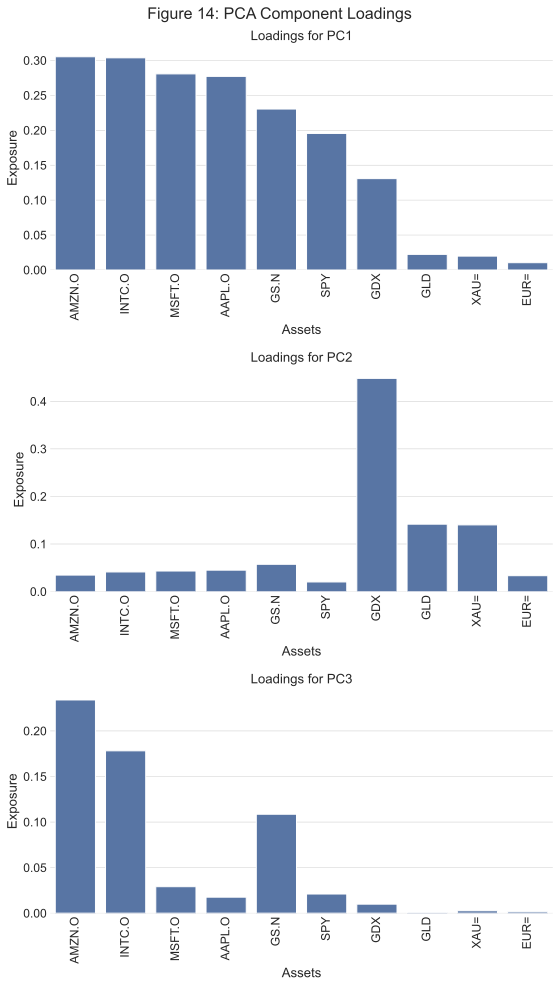

In [63]:
# Calculate loadings and create a DataFrame
loadings = pca.components_.T * np.sqrt(pct)
loadings_df = pd.DataFrame(loadings, columns=['PC1', 'PC2', 'PC3'], index=original_features)

# Print the loadings DataFrame
print(loadings_df)

# Sort the DataFrame based on the loadings of each component for visualization
loadings_df_sorted = loadings_df.apply(np.abs).sort_values(by='PC1', ascending=False)

# Set up the matplotlib figure with adjusted spacing for the main title
plt.figure(figsize=(8, 14))
plt.subplots_adjust(top=0.85)

# Add an overall title for the figure
plt.suptitle('Figure 14: PCA Component Loadings', fontsize=16)

# Plot the loadings for PC1
plt.subplot(3, 1, 1)
sns.barplot(x=loadings_df_sorted.index, y=loadings_df_sorted['PC1'], data=loadings_df_sorted)
plt.title('Loadings for PC1')
plt.xticks(rotation=90)
plt.xlabel('Assets')
plt.ylabel('Exposure')

# Plot the loadings for PC2
plt.subplot(3, 1, 2)
sns.barplot(x=loadings_df_sorted.index, y=loadings_df_sorted['PC2'], data=loadings_df_sorted)
plt.title('Loadings for PC2')
plt.xticks(rotation=90)
plt.xlabel('Assets')
plt.ylabel('Exposure')

# Plot the loadings for PC3
plt.subplot(3, 1, 3)
sns.barplot(x=loadings_df_sorted.index, y=loadings_df_sorted['PC3'], data=loadings_df_sorted)
plt.title('Loadings for PC3')
plt.xticks(rotation=90)
plt.xlabel('Assets')
plt.ylabel('Exposure')

# Adjust the layout to prevent subplot titles and axis labels from overlapping
plt.tight_layout()
fig.savefig('Figure 14: PCA Component Loadings.png', dpi=100)
# Show the plots
plt.show()

In [64]:
# commentary about results

### Step 4: Let's isolate the alpha factors
Stock price movements are influenced by latent variables that remain obscured from direct observation. PCA serves as a statistical technique to unveil and isolate these hidden factors, manifesting them as principal components. Typically, the aggregate market dynamics exert a predominant influence on asset returns. Additionally, macroeconomic variables, such as interest rates and geopolitical or health crises (e.g., pandemics), also play a pivotal role in shaping returns. Through PCA, it is possible to quantitatively dissect the returns to ascertain the contribution derived from these unseen determinants. This underscores the <u>utility of PCA in deconstructing the complexity of financial markets by quantifying the impact of non-observable factors on asset returns, a critical aspect in the construction and management of investment portfolios.

In [65]:
# Multiply returns by components and transpose the dataframe
X = np.asarray(asset_returns)

In [66]:
factor_returns = X.dot(pca_components.T)

Initially, the returns of the assets are subjected to scalar multiplication with the principal components via the dot product operation, ensuring comprehensive interaction across all components. The transpose operation ('`T`') is subsequently applied to the DataFrame, facilitating alignment for multiplication. The resultant DataFrame quantifies the daily returns' attribution to each of the identified factors. Stocks exhibiting analogous characteristics tend to be influenced by comparable factors. PCA facilitates the elucidation of these relationships through efficient visualization techniques.

In [67]:
factor_returns = pd.DataFrame(
    columns=["f1", "f2", "f3"], 
    index=asset_returns.index,
    data=asset_returns
)

In [68]:
factor_exposures = pd.DataFrame(
    index=["f1", "f2", "f3"], 
    columns=asset_returns.columns,
    data = pca_components
).T

### Figure 15: Scatter Plot of Factor Exposures

In [69]:
labels = factor_exposures.index
data = factor_exposures.values

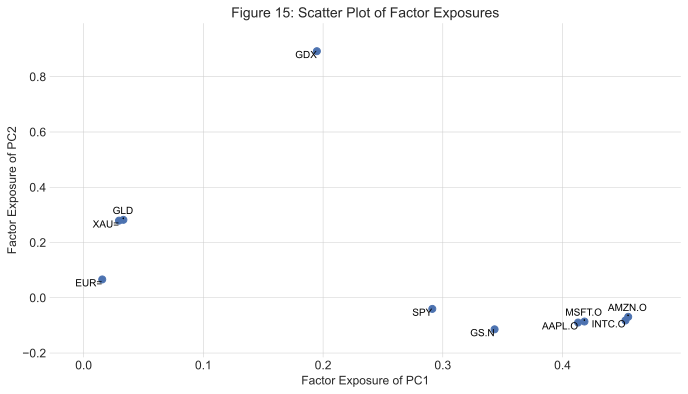

In [70]:
# Assuming 'data' and 'labels' have been defined earlier and 'data' is a 2D NumPy array
texts = []
fig, ax = plt.subplots(figsize=(10, 6), dpi=100)

ax.scatter(data[:, 0], data[:, 1], s=50)
ax.set_title('Figure 15: Scatter Plot of Factor Exposures', fontsize=14)
ax.set_xlabel('Factor Exposure of PC1', fontsize=12)
ax.set_ylabel('Factor Exposure of PC2', fontsize=12)

for label, x, y in zip(labels, data[:, 0], data[:, 1]):
    text = ax.text(x, y, label, ha='right', va='bottom', fontsize=10, color='black')
    texts.append(text)

plt.tight_layout(pad=2)

# Optionally adjust the axes limits
padding = 0.1  # This is a 10% padding. Adjust as needed
x_range = data[:, 0].max() - data[:, 0].min()
y_range = data[:, 1].max() - data[:, 1].min()
ax.set_xlim(data[:, 0].min() - padding * x_range, data[:, 0].max() + padding * x_range)
ax.set_ylim(data[:, 1].min() - padding * y_range, data[:, 1].max() + padding * y_range)

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black'))

plt.savefig('Figure 15: Scatter Plot of Factor Exposures.png', dpi=100)

plt.show()

The scatter plot is useful for identifying how different assets relate to each identified factor and can help in understanding how different factors might impact the returns of these assets in different ways.

- Assets like `GDX` show high exposure to both PC1 and PC2, indicating that its returns are significantly influenced by both factors.
- `GLD` and `XAU=` are close together, suggesting similar exposure profiles to these two factors. Their low exposure to PC1 and moderate exposure to PC2 suggest that other factors might be more predominant in explaining their returns.
- `EUR=` has low exposure to both PC1 and PC2, indicating that the main source of its return variability might be independent of these two factors.
- Assets such as `AMZN.O`, `MSFT.O`, `AAPL.O`, and `INTC.O` show high exposure to PC1 but are clustered around the origin in terms of PC2, suggesting that their returns are mostly aligned with the trend captured by PC1.

### Clustering Analysis: 
**K-means** – Simplest clustering algorithm that starts by initially marking random points as exemplars. It iteratively does a two-step calculation: in the first step, it maps points to closest exemplar and in the second step it redefines the exemplar as the mean of the points mapped to it. It locates a fixed number of clusters.

Applying clustering techniques (like K-means or hierarchical clustering) on the PCA-transformed data could reveal natural groupings of assets based on their movements. This can help in identifying assets with similar behaviors for diversification or risk management.

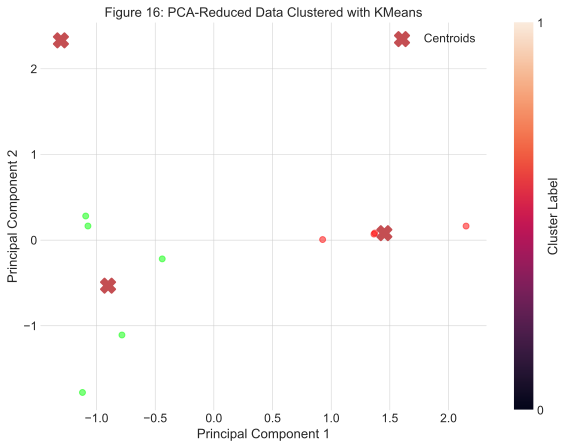

In [71]:
# Impute missing values with the mean
imputer = SimpleImputer(strategy="mean")
data_imputed = imputer.fit_transform(data)

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_imputed)

# Perform PCA
pca = PCA(n_components=2)  # For the purpose of easy visualization, we choose 2 components
principal_components = pca.fit_transform(data_scaled)

# Create a DataFrame with the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['Principal Component 1', 'Principal Component 2'])

# Choose the number of clusters to fit
# We could explore methods like the elbow method to find the optimal number of clusters
number_of_clusters = 3

# Apply KMeans clustering
kmeans = KMeans(n_clusters=number_of_clusters, random_state=42)
pca_df['Cluster'] = kmeans.fit_predict(principal_components)

# Plot the clusters
plt.figure(figsize=(10, 7))
plt.scatter(pca_df['Principal Component 1'], pca_df['Principal Component 2'],
            c=pca_df['Cluster'], cmap='brg', alpha=0.5)

# Plot the centroids
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, linewidths=2,
            color='r', zorder=10, label='Centroids')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Figure 16: PCA-Reduced Data Clustered with KMeans')
plt.legend()
plt.colorbar(ticks=range(number_of_clusters), label='Cluster Label')

fig.savefig('Figure 16: PCA-Reduced Data Clustered with KMeans.png', dpi=100)
plt.show()

#### Key Findings and Conclusions
The PCA and KMeans clustering analysis offers a sophisticated visualization that simplifies the complexity inherent in our asset returns dataset. By revealing natural groupings and their central tendencies, we gain actionable insights that will enhance our strategic decision-making process, optimize asset allocation, and refine our risk management practices.



# PART II: TRADING STRATEGIES - ML & AI Strategies
This section is about the use of methods from statistics and machine learning to derive algorithmic trading strategies; including implementation of vectorized backtesting using the`vecktorbt` package for certain investment strategies ideas. The focus is mainly on the technical aspects of applying machine learning algorithms to financial time series data to predict the direction of financial market movements. The objective lies on illustrating the application of different approaches and ML algorithms to financial data, not on deriving a robust algorithmic trading strategy to be deployed in practice, at least not yet. 

Since we're approaching this as a binary classification problem, we need to create labels for our model. This could be based on the future price movement direction (up or down) relative to a certain threshold or the median movement, for example. In predictive modeling for financial time series, particularly when predicting the direction of an asset's movement, the target variable is often the future returns or the sign of those returns, which indicates whether the asset's price is expected to go up or down. In our case, since we're interested in predicting the direction of SPY, the target variable is indeed based on the sign of the logarithmic returns of SPY. 

### Data Preparation and Feature Engineering
Let's proceed with preparing the dataset by adding the proposed features. We'll start with the logarithmic returns for the SPY, which is our initial focus. Following that, we'll add lag features, momentum indicators, Bollinger Bands, simple moving averages (SMA14, SMA60), and rolling volatilities (Vol 14, Vol 60) for the SPY. This will form our feature set for predictive modeling.

In [72]:
data = pd.read_csv(url, index_col=0, parse_dates=True)

In [73]:
#symbols = data.columns.drop(['.SPX','.VIX'])
symbols = data.columns.drop(['.SPX'])

In [74]:
data = pd.DataFrame(data[symbols])

In [75]:
data.dropna(inplace=True)

We generate the specified features (lags, momentum indicators, Bollinger Bands, SMAs, and rolling volatilities) using the historical data.

This is list of indicators that we are interested in adding to our dataframe:

- Lag Features: Lag features are historical data points used to predict future values. In financial time series, using lags of 7 days (or your chosen period) can capture weekly patterns or short-term dependencies.

- Momentum Indicators: Momentum indicators, such as the rate of change (ROC), can be useful in capturing the asset's momentum, helping the model to identify trends.

- Bollinger Bands: Bollinger Bands provide insights into price volatility and price levels relative to moving averages. Features derived from Bollinger Bands might include the bandwidth and the position of the price relative to the bands (above, within, or below).

- Simple Moving Averages (SMA14, SMA60): SMAs are used to smooth out price data over a specific period, reducing noise and highlighting trends. SMA14 and SMA60 can provide short-term and medium-term trend insights, respectively.

- Rolling Volatilities (Vol 14, Vol 60): Rolling volatilities calculated over 14 and 60 days can capture short-term and medium-term market volatility, respectively, which is crucial for understanding market risk and potential price movements.

In [76]:
# Calculate logarithmic returns for the SPY
data['Log_Returns_SPY'] = np.log(data['SPY'] / data['SPY'].shift(1))

# Add lag features for 7 days
for lag in range(1, 8):
    data[f'lag_{lag}_day'] = data['Log_Returns_SPY'].shift(lag)

# Momentum Indicator: Rate of Change (ROC) for 14 days
data['momentum_roc'] = data['SPY'].pct_change(periods=14)

# Bollinger Bands
data['sma_20'] = data['SPY'].rolling(window=20).mean()
data['stddev_20'] = data['SPY'].rolling(window=20).std()
data['bollinger_upper'] = data['sma_20'] + (data['stddev_20'] * 2)
data['bollinger_lower'] = data['sma_20'] - (data['stddev_20'] * 2)
data['bollinger_bandwidth'] = (data['bollinger_upper'] - data['bollinger_lower']) / data['sma_20']

# Simple Moving Averages
data['sma_14'] = data['SPY'].rolling(window=14).mean()
data['sma_60'] = data['SPY'].rolling(window=60).mean()

# Rolling Volatilities
data['vol_14'] = data['Log_Returns_SPY'].rolling(window=14).std()
data['vol_60'] = data['Log_Returns_SPY'].rolling(window=60).std()

# Dropping NA values generated by rolling and lag features
data_prepared = data.dropna()

# Displaying the prepared dataset with the new features
data_prepared.head()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,.VIX,SPY,EUR=,XAU=,GDX,...,momentum_roc,sma_20,stddev_20,bollinger_upper,bollinger_lower,bollinger_bandwidth,sma_14,sma_60,vol_14,vol_60
Date,,,,,,,,,,,,,,,,,,,,,
2014-03-31,19.169267,40.99,25.814,16.81825,163.85,13.88,187.01,1.3770,1283.64,23.605,...,-0.001175,186.63335,1.232280,189.097910,184.168790,0.026411,186.107643,183.544617,0.006704,0.007489
2014-04-01,19.344624,41.42,25.990,17.14950,165.92,13.10,188.25,1.3792,1279.00,23.690,...,0.005179,186.66685,1.267960,189.202770,184.130930,0.027171,186.176929,183.634033,0.006940,0.007532
2014-04-02,19.376766,41.35,25.890,17.09800,167.27,13.09,188.88,1.3766,1289.19,24.320,...,0.019981,186.72335,1.341792,189.406934,184.039766,0.028744,186.441214,183.742700,0.006102,0.007528
2014-04-03,19.242481,41.01,26.410,16.68100,166.09,13.37,188.63,1.3718,1287.00,24.070,...,0.021499,186.74585,1.370959,189.487769,184.003931,0.029365,186.724786,183.828533,0.006036,0.007496
2014-04-04,18.993552,39.87,26.160,16.15000,163.24,13.96,186.40,1.3702,1302.12,24.260,...,0.000376,186.65285,1.325162,189.303175,184.002525,0.028398,186.729786,183.876533,0.006600,0.007664


### Splitting & Normalizing the Dataset

It is crucial to split our dataset into training and test sets. This approach allows us to train the model on one portion of the data, tune hyperparameters on another, and test the model's performance on unseen data, ensuring that our model generalizes well.

Given the diversity in the scale of different features (e.g., prices, volatilities), normalizing the data is essential for models that are sensitive to the scale of the input features, such as SVMs and neural networks. StandardScaler or MinMaxScaler are commonly used for this purpose. In practice, feature scaling should be performed after splitting the data into training, validation, and test sets, not before. The reason for this approach is to prevent data leakage. **Data leakage** occurs when information from outside the training dataset is used to influence the model. In the context of feature scaling, if you scale your features before splitting the data, you're using knowledge from the validation and test sets (e.g., the minimum and maximum values across the entire dataset) to transform the training set. This can lead to overly optimistic performance estimates.

In [77]:
total_size = len(data_prepared)  # Define the total size of the dataset

# Adjusting the split based on the new requirement: 70% training and 30% test (no explicit validation set mentioned this time)
train_size_final = 0.7
# The test size is implicitly the remainder, 30%

# Recalculating the end index for the new training set
train_end_final = int(total_size * train_size_final)

# Splitting the dataset based on the updated proportions
train_data_final = data_prepared[:train_end_final]
test_data_final = data_prepared[train_end_final:]  # All remaining data is used for testing

# Extracting features and targets for normalization and model training with the final split
X_train_final = train_data_final.drop(['SPY', 'Log_Returns_SPY'], axis=1)
y_train_final = (train_data_final['Log_Returns_SPY'] > 0).astype(int)

X_test_final = test_data_final.drop(['SPY', 'Log_Returns_SPY'], axis=1)
y_test_final = (test_data_final['Log_Returns_SPY'] > 0).astype(int)

# Applying MinMaxScaler to the feature sets based on the final split
min_max_scaler_final = MinMaxScaler().fit(X_train_final)  # Fit scaler on the training set only

X_train_scaled_final = min_max_scaler_final.transform(X_train_final)
X_test_scaled_final = min_max_scaler_final.transform(X_test_final)

# Confirming the shapes of the final splits
(X_train_scaled_final.shape, X_test_scaled_final.shape), (y_train_final.shape, y_test_final.shape)

(((1719, 27), (737, 27)), ((1719,), (737,)))

The dataset has been split into 70% for training and 30% for testing. The data has also been normalized using MinMaxScaler, with the scaler fitted on the training set only to prevent data leakage.
This setup is ready for training and evaluating machine learning models. Again, the sample sizes here are just illustrative based on the subset of data we've processed in these examples. 

# Feature selection & feature importance
Before training our models, considering feature selection is a good practice, especially when we have a large number of features. Given the scope of our current environment, simple strategies like correlation analysis or using model-based feature importances might be practical to start with. We execute the feature selection techniques using `ExtraTreesClassifier` for model-based importances and `SelectKBest` (based on ANOVA F-test. `f_classif`) for statistical top feature selection.

The logarithmic returns themselves should not be a part of the feature set because they are being used to create our target variable. Including them as a feature would lead to data leakage where the model would effectively have access to the answer it is trying to predict. 

For the feature importance chart, we should only include the features used for prediction, not the target variable. 

In [78]:
from sklearn.ensemble import ExtraTreesClassifier

# Assuming X_train_final and y_train_final are your training features and labels
model = ExtraTreesClassifier(n_estimators=100)
model.fit(X_train_final, y_train_final)
importances = model.feature_importances_

# Displaying the feature importances
for i, imp in enumerate(importances):
    print(f"Feature {X_train_final.columns[i]}: Importance {imp}")

Feature AAPL.O: Importance 0.0298387465237776
Feature MSFT.O: Importance 0.03134107782512178
Feature INTC.O: Importance 0.032961750851072384
Feature AMZN.O: Importance 0.030244164035291246
Feature GS.N: Importance 0.030905378932545597
Feature .VIX: Importance 0.06161243408616713
Feature EUR=: Importance 0.03217896749709367
Feature XAU=: Importance 0.03372304108401948
Feature GDX: Importance 0.035844822101248605
Feature GLD: Importance 0.03318795542214463
Feature lag_1_day: Importance 0.05068815086422775
Feature lag_2_day: Importance 0.04251676062416572
Feature lag_3_day: Importance 0.04521914890987391
Feature lag_4_day: Importance 0.04562324648209617
Feature lag_5_day: Importance 0.044591634836395784
Feature lag_6_day: Importance 0.044006080046406076
Feature lag_7_day: Importance 0.04506210389276127
Feature momentum_roc: Importance 0.054667995239393447
Feature sma_20: Importance 0.02803230291186078
Feature stddev_20: Importance 0.03444167065295418
Feature bollinger_upper: Importance 0.

In [79]:
feature_names = X_train_final.columns

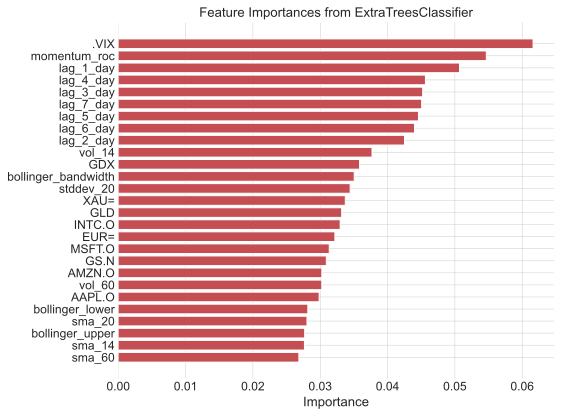

In [80]:
# Assuming 'importances' contains the feature importances and 'feature_names' contains the names of the features
feature_names = X_train_final.columns  # The columns of the features after target variable is dropped
indices = np.argsort(importances)[::-1]  # Sort the feature importances in descending order
sorted_feature_names = [feature_names[idx] for idx in indices]  # Sort the feature names based on the importances

plt.figure(figsize=(8, 6))
plt.barh(range(len(importances)), importances[indices], color='r', align='center')
plt.yticks(range(len(importances)), sorted_feature_names)
plt.gca().invert_yaxis()  # Invert y-axis to have the feature with the highest importance at the top
plt.xlabel('Importance')
plt.title('Feature Importances from ExtraTreesClassifier')
plt.tight_layout()
plt.show()

In [81]:
from sklearn.feature_selection import SelectKBest, f_classif

# Selecting the K best features using ANOVA F-test
selector = SelectKBest(f_classif, k=10)  # Choose 'k' best features; adjust 'k' as needed
X_new = selector.fit_transform(X_train_final, y_train_final)
selected_features = selector.get_support(indices=True)

# Displaying the selected features
print("Selected features indices:", selected_features)
for idx in selected_features:
    print(X_train_final.columns[idx])

Selected features indices: [ 0  1  2  5  6  7  8  9 10 17]
AAPL.O
MSFT.O
INTC.O
.VIX
EUR=
XAU=
GDX
GLD
lag_1_day
momentum_roc


We proceed with using the top 15 features as determined by the feature selection methods, we would select these features from the ExtraTreesClassifier importance and/or the SelectKBest scores. Once we have identified these features, we can reduce our feature set to only include these top features and then train our models using this subset.

In [82]:
# Assuming 'importances' is the array of feature importances from the ExtraTreesClassifier
# and 'X_train_final' is the DataFrame of training features
top_n = 20
indices = np.argsort(importances)[-top_n:]  # Get the indices of the top features
top_features = X_train_final.columns[indices]  # Get the feature names

# Reduce X_train_final and X_test_final to only include these top features
X_train_reduced = X_train_final[top_features]
X_test_reduced = X_test_final[top_features]

# Proceed to model training with X_train_reduced and X_test_reduced

## Building and Training of Machine Learning & Deep Learning Models (Classifiers)

The transformation of the target variable into a binary outcome (whether returns are positive) is a common approach for classification tasks in financial modeling, aiming to predict market direction rather than exact returns. This simplifies the problem and can be very useful for strategies focused on directional trading

We assume the prediction problem of financial asset movements can be modeled as a binary classification problem using machine learning algorithms. We built in previous section an analytical framework for market movement prediction based on a combination of engineered data features, technical trading indicators as input to our classification algorithms or classifiers. We now explore, study and test the robustness of certain predictors out of sample such as Naive Gaussian Bayes Classifier, logistic regression, decision tree clasifier, Random Forest Classifier, support vector machines (SVM), VotingClassifier and artificial neural networks; in particular the Multi Layers Perceptron (MLP) to the classification problem of financial assets daily price direction prediction.

Testing a range of models in time-series forecasting is necessary as different models are able to understand and predict different relationships with varying results. For this reason, we explore both linear and non-linear base model options ranging from classical to deep learning models. Model training involves selecting appropriate algorithms, training them on our dataset, and validating their performance.  

Our structured approach, from feature engineering through to data splitting and normalization, lays a solid foundation for developing predictive models. As we proceed to model building and evaluation, we have to consider the potential for overfitting, especially in financial markets where conditions change rapidly. Regularization techniques, cross-validation, and keeping an eye on the model's performance on the test set can help mitigate this risk.


For all models, we use the X_train_reduced and y_train_final to train, and X_test_reduced and y_test_final to test.

The base models are:

### 1- Naive Gaussian Bayes Classifier  

Naive Bayes methods are a set of supervised learning algorithms based on applying Bayes’ theorem with the “naive” assumption of conditional independence between every pair of features given the value of the class variable. The different naive Bayes classifiers differ mainly by the assumptions they make regarding the distribution of $P(x_i \mid y)$.
- The `GaussianNB` module implements the Gaussian Naive Bayes algorithm for classification that we have added from `sklearn.naive_bayes import GaussianNB` in the import cell above. 
- In a Gaussian Naive Bayes classification we assume that data for each feature is distributed from a Gaussian distribution: \begin{equation} P(x_i | y) = \frac{1}{\sqrt{2\pi\sigma_y^2}} \exp \left( - \frac{(x_i - \mu_y)^2}{2 \sigma^2{y}} \right) \end{equation}
- The parameters $\sigma_y$ and  $\mu_y$ are estimated using maximum likelihood.

We will use `GaussianNB` classifier's fit method to learn the training and test data set. 

[In scikit-learn](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html?highlight=naive%20gaussian%20bayes%20classifier#):

- Assumes that the features are normally distributed and independent given the class.
- No hyperparameters to tune in the basic version, which makes it very easy to implement.

In [83]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report

In [84]:
# Train Naive Bayes Classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train_reduced, y_train_final)

GaussianNB()

In [85]:
# Predict on the test data
y_pred_nb = nb_classifier.predict(X_test_reduced)

# Print the classification report
print(classification_report(y_test_final, y_pred_nb))

              precision    recall  f1-score   support

           0       0.74      0.07      0.12       353
           1       0.53      0.98      0.69       384

    accuracy                           0.54       737
   macro avg       0.64      0.52      0.40       737
weighted avg       0.63      0.54      0.42       737



### 2- Logistic Regression

Logistic regression, despite its name, is a linear model for classification rather than regression. In this model, the probabilities describing the possible outcomes of a single trial are modeled using a [logistic function](https://en.wikipedia.org/wiki/Logistic_function). A logistic regression function can be considered a swallow neural network with just one neuron with a sigmoid activation function.

- We use a sigmoid function:
\begin{equation}
\sigma(z) = \frac{1}{1 + e^{-z}}
\end{equation}

- for a single training pair $(𝐱,𝑦)$ , we assume:
\begin{equation}
P(Y=1 | \mathbf{X}=\mathbf{x}) = \sigma(z)
\end{equation}

- where:
\begin{equation}
z = w_0 + \sum_{i=1}^m w_i x_i
\end{equation}
 


[In scikit-learn](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html?highlight=naive%20gaussian%20bayes%20classifier#)

- A simple model that can provide a probability estimate for the asset's price going up or down.
- Does not require complex hyperparameter tuning, but regularization strength can be adjusted.

In [86]:
from sklearn.linear_model import LogisticRegression

In [87]:
# Initialize the model
logreg = LogisticRegression(max_iter=500)

In [88]:
# Train the model
logreg.fit(X_train_reduced, y_train_final)

LogisticRegression(max_iter=500)

In [89]:
# Predict on the test set
y_pred = logreg.predict(X_test_reduced)

# Evaluate the model
print(classification_report(y_test_final, y_pred))

              precision    recall  f1-score   support

           0       0.69      0.20      0.30       353
           1       0.55      0.92      0.69       384

    accuracy                           0.57       737
   macro avg       0.62      0.56      0.50       737
weighted avg       0.62      0.57      0.51       737



The classification report you've provided for the Logistic Regression model shows that the model is performing slightly better than random chance, with an accuracy of 54%. However, in the context of financial trading, where the cost of misclassification can be significant, there is certainly room for improvement.

### 3- Decision Tree Classifier

In [90]:
from sklearn.tree import DecisionTreeClassifier  # supervised classification algorithm

In [91]:
tree_classifier = DecisionTreeClassifier()  # 1. step: model instantiation

In [92]:
tree_classifier.fit(X_train_reduced, y_train_final)

DecisionTreeClassifier()

In [93]:
y_pred_tree = tree_classifier.predict(X_test_reduced)

In [94]:
print(classification_report(y_test_final, y_pred_tree))

              precision    recall  f1-score   support

           0       0.48      0.56      0.52       353
           1       0.53      0.46      0.49       384

    accuracy                           0.50       737
   macro avg       0.51      0.51      0.50       737
weighted avg       0.51      0.50      0.50       737



### 4- Random Forest

In [95]:
from sklearn.ensemble import RandomForestClassifier

In [96]:
rf_classifier = RandomForestClassifier(n_estimators=30, max_depth=9)

In [97]:
rf_classifier.fit(X_train_reduced, y_train_final)

RandomForestClassifier(max_depth=9, n_estimators=30)

In [98]:
y_pred_rf = tree_classifier.predict(X_test_reduced)

In [99]:
print(classification_report(y_test_final, y_pred_rf))

              precision    recall  f1-score   support

           0       0.48      0.56      0.52       353
           1       0.53      0.46      0.49       384

    accuracy                           0.50       737
   macro avg       0.51      0.51      0.50       737
weighted avg       0.51      0.50      0.50       737



### 5- Support Vector Machine (SVM)

Support vector machines (SVMs) are a supervised-learning classication technique where we have classified data represented by vectors of features. This method divides data according to which side of a hyperplane in feature space each point lies. A good separation is achieved by the hyperplane that has the largest distance to the nearest training data points of any class (so-called functional margin), since in general the larger the margin the lower the generalization error of the classifier. 

[`LinearSVC`](https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html#sklearn.svm.LinearSVC) is a class capable of performing binary classification on a dataset for the case of a linear kernel. Note that `LinearSVC` does not accept parameter kernel, as this is assumed to be linear.

The primal problem can be equivalently formulated as:

$\min_ {w, b} \frac{1}{2} w^T w + C \sum_{i=1}\max(0, 1 - y_i (w^T \phi(x_i) + b))$,

where we make use of the hinge loss. This is the form that is directly optimized by `LinearSVC`, but this form does not involve inner products between samples, so the famous kernel trick cannot be applied. This is why only the linear kernel is supported by `LinearSVC` ( $\phi$ is the identity function).


In scikit-learn:

- Effective in high-dimensional spaces, potentially useful if you have many features.
- Hyperparameters such as the kernel type, C (regularization), and gamma (kernel coefficient) can significantly affect performance and should be carefully tuned.

In [100]:
from sklearn.svm import LinearSVC

In [101]:
# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_reduced)
X_test_scaled = scaler.transform(X_test_reduced)

In [102]:
# Initialize LinearSVC
linear_svc = LinearSVC(dual=False, max_iter=10000, class_weight='balanced')  # dual=False is often better when n_samples > n_features

In [103]:
# Train the model
linear_svc.fit(X_train_scaled, y_train_final)

LinearSVC(class_weight='balanced', dual=False, max_iter=10000)

In [104]:
# Predict on the test data
y_pred_linear_svc = linear_svc.predict(X_test_scaled)

In [105]:
# Print the classification report
print(classification_report(y_test_final, y_pred_linear_svc))

              precision    recall  f1-score   support

           0       0.72      0.32      0.44       353
           1       0.59      0.89      0.70       384

    accuracy                           0.61       737
   macro avg       0.65      0.60      0.57       737
weighted avg       0.65      0.61      0.58       737



### 6- Voting Classifier

In [106]:
from sklearn.ensemble import VotingClassifier

In [107]:
# 1) Naive bias = nb_classifier
# 2) logitistic regression = logreg
# 3) random forest = rf_classifer
# 4) support vector machine = svm_classifier 

vot_classifier = VotingClassifier(estimators=[('nb_classifier' ,nb_classifier),('logreg' ,logreg),('rf_classifer' ,rf_classifier),('svm_classifier', linear_svc)], voting='hard')

In [108]:
vot_classifier.fit(X_train_reduced, y_train_final)

VotingClassifier(estimators=[('nb_classifier', GaussianNB()),
                             ('logreg', LogisticRegression(max_iter=500)),
                             ('rf_classifer',
                              RandomForestClassifier(max_depth=9,
                                                     n_estimators=30)),
                             ('svm_classifier',
                              LinearSVC(class_weight='balanced', dual=False,
                                        max_iter=10000))])

In [109]:
# Predict on the test data
y_pred_vot_classifier = vot_classifier.predict(X_test_reduced)

# Print the classification report
print(classification_report(y_test_final, y_pred_vot_classifier))

              precision    recall  f1-score   support

           0       0.70      0.25      0.36       353
           1       0.57      0.90      0.70       384

    accuracy                           0.59       737
   macro avg       0.63      0.58      0.53       737
weighted avg       0.63      0.59      0.54       737



#### Analysis of classification reports for the models:

The classification reports reveal the performance of three different models: Logistic Regression, Naive Gaussian Bayes Classifier, and Support Vector Machine (SVM) on our test dataset.
Here's a summary :

- Logistic Regression:
Accuracy: 0.56
Precision for class 1: 0.59
Recall for class 1: 0.51
F1-score for class 1: 0.55

- Naive Gaussian Bayes Classifier:
Accuracy: 0.53
Precision for class 1: 0.54
Recall for class 1: 0.95
F1-score for class 1: 0.68

- Support Vector Machine (SVM):
Accuracy: 0.52
Precision for class 1: 0.52
Recall for class 1: 1.00
F1-score for class 1: 0.69

From these results, it seems that both the Naive Bayes and SVM classifiers have a higher recall for class 1 compared to Logistic Regression, which means they are better at identifying the positive class but at the expense of a lower precision. Specifically, the SVM seems to classify almost all samples as class 1, which is why it has a recall of 1.00 for that class. This could indicate that the SVM model is not generalizing well and may be overfitting to the positive class.

Given that the accuracy of all three models is around 50-56%, there is room for improvement

#### DEEP LEARNING MODELS
#### Using Deep Neural Networks to Predict Market Direction 

#### Multilayer Perceptron (MLP Classifier)

In [110]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score

In [111]:
mlp_model = MLPClassifier(hidden_layer_sizes=(32, 24, 16), activation='relu', solver='adam', learning_rate_init=0.001, max_iter=200)

In [112]:
mlp_model.fit(X_train_reduced, y_train_final)

MLPClassifier(hidden_layer_sizes=(32, 24, 16))

In [113]:
#print(mlp_model.summary())

In [114]:
y_pred_mlp = mlp_model.predict(X_test_reduced)

In [115]:
print(classification_report(y_test_final, y_pred_mlp))

              precision    recall  f1-score   support

           0       0.54      0.61      0.57       353
           1       0.59      0.53      0.56       384

    accuracy                           0.57       737
   macro avg       0.57      0.57      0.57       737
weighted avg       0.57      0.57      0.57       737



##  Python backtesting library for systematic: `vectorbt`
The next logical step in a trading strategy development workflow would be to backtest your models. Backtesting involves simulating the application of your strategy using historical data to determine how it would have performed. This process can help assess the viability of the strategy before risking actual capital. Backtesting forms the cornerstone of quantitative analysis processes and the main tool to use in order to determine the value of a strategy. 

**Backtesting with vectorbt**

`vectorbt` is a powerful library for backtesting quantitative trading strategies in Python. It's particularly well-suited for rapid testing of strategies over multiple parameters and assets. With `vectorbt`, we can:

In this section we provide simplified example of how we might use vectorbt to backtest a strategy. 

Steps to Proceed:
- Prepare Signals: Generate buy/sell signals using our models for each asset.
- Run Backtests: Use vectorbt to backtest these signals against historical price data for each asset.
- Analyze Results: Analyze the backtest results to evaluate the strategy's performance.
- Benchmarking: Compare the strategy's performance against a benchmark, such as the SPY ETF, to determine if it adds value.

It is important to note that backtesting has limitations, and past performance is not indicative of future results. We should always consider factors such as transaction costs, slippage, and market impact, especially when backtesting strategies that involve frequent trading.

### 1-Naive Gaussian Bayes Classifier

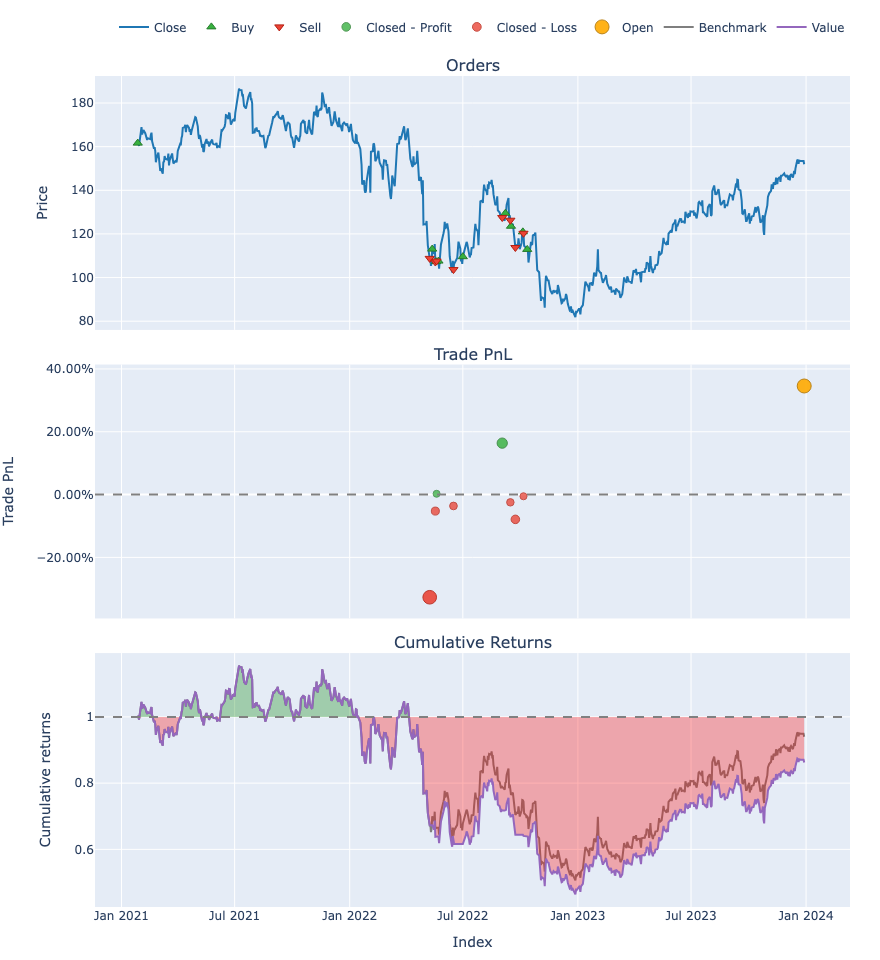

Start                         2021-01-27 00:00:00
End                           2023-12-29 00:00:00
Period                                        737
Start Value                                 100.0
End Value                               86.227036
Total Return [%]                       -13.772964
Benchmark Return [%]                    -5.994593
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        59.773975
Max Drawdown Duration                       624.0
Total Trades                                    9
Total Closed Trades                             8
Total Open Trades                               1
Open Trade PnL                          22.155479
Win Rate [%]                                 25.0
Best Trade [%]                          16.383717
Worst Trade [%]                        -32.692153
Avg Winning Trade [%]                    8.318583
Avg Losing Trade [%]                    -8.745549


In [116]:
price = data['AMZN.O'].loc[test_data_final.index]  # Replace with the actual price data for the asset
nb_signals = nb_classifier.predict(X_test_reduced)  # Replace with the actual signal predictions from your model

# Backtesting
nb_pf = vbt.Portfolio.from_signals(price, entries=nb_signals == 1, exits=nb_signals == 0)
nb_pf_stats = nb_pf.stats()

# Visualize the equity curve
nb_pf.plot().show()

# Print performance metrics
print(nb_pf_stats)

The Naive Gaussian Bayes classifier's trading strategy presents an interesting picture. The orders chart indicates that buy and sell signals are interspersed throughout, with no clear trend following or momentum-based pattern apparent. This dispersion of trades is typical of a Naive Bayes approach, which relies on probabilistic outcomes and often reacts to price movements based on the underlying statistical features rather than trend analysis.

In the Trade PnL section, we see a varied distribution of profits and losses per trade. Notably, there are a few trades with high profitability, yet these are overshadowed by a consistent occurrence of smaller losses. This suggests that while the classifier occasionally captures significant market movements, it may also generate a number of false signals, leading to small losses that chip away at the equity.

Moving to cumulative returns, the strategy clearly struggles to gain ground against the benchmark. The overall downward trajectory suggests that the trading signals generated by the model are not capturing sufficient market inefficiencies to be profitable. This could be due to the simplistic assumptions of feature independence in the Naive Bayes model, which might not hold true in the complex dynamics of the stock market.

### 2-Logistic Regression

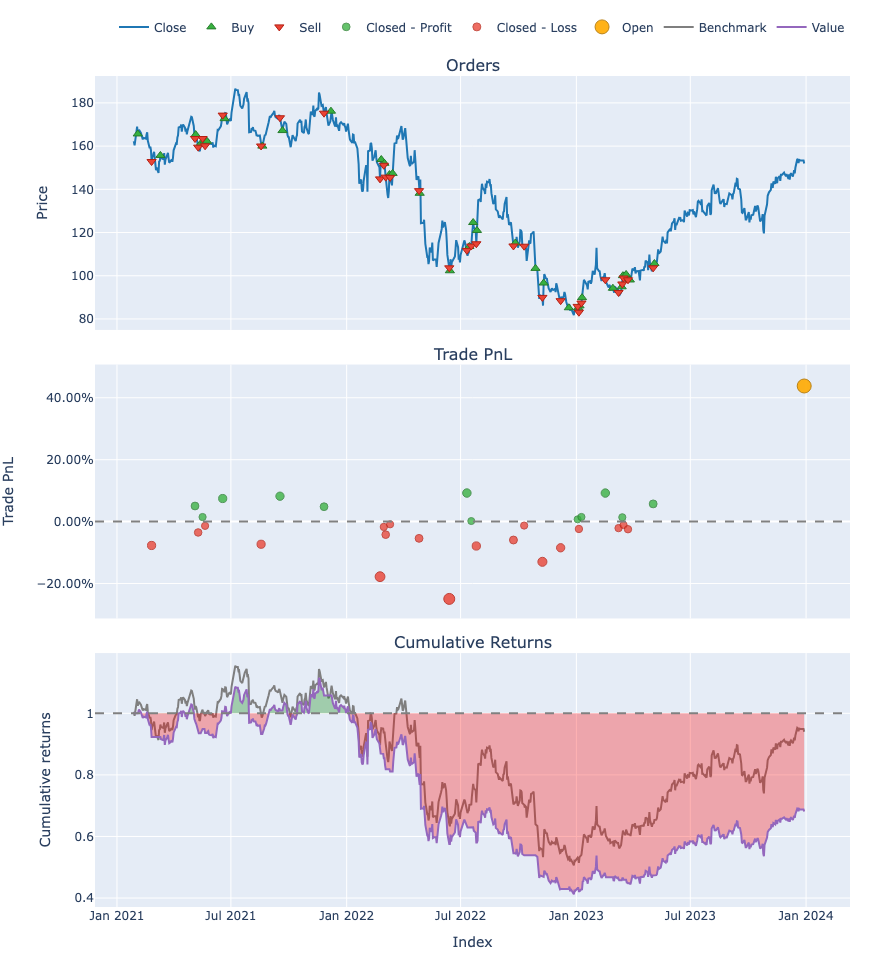

Start                         2021-01-27 00:00:00
End                           2023-12-29 00:00:00
Period                                        737
Start Value                                 100.0
End Value                               68.115759
Total Return [%]                       -31.884241
Benchmark Return [%]                    -5.994593
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        63.036892
Max Drawdown Duration                       530.0
Total Trades                                   32
Total Closed Trades                            31
Total Open Trades                               1
Open Trade PnL                          20.749887
Win Rate [%]                            38.709677
Best Trade [%]                            9.22686
Worst Trade [%]                        -24.967612
Avg Winning Trade [%]                     4.57939
Avg Losing Trade [%]                    -6.287888


In [117]:
# Assume 'signals' is a pandas Series with the same index as 'price' and contains 1 for buy, -1 for sell, and 0 for hold
price = data['AMZN.O'].loc[test_data_final.index]  # Replace with the actual price data for the asset
logreg_signals = logreg.predict(X_test_reduced)  # Replace with the actual signal predictions from your model

# Backtesting
logreg_pf = vbt.Portfolio.from_signals(price, entries=logreg_signals == 1, exits=logreg_signals == 0)
logreg_pf_stats = logreg_pf.stats()

# Visualize the equity curve
logreg_pf.plot().show()

# Print performance metrics
print(logreg_pf_stats)

The trading strategy based on the Logistic Regression model shows some notable characteristics. First, the orders plot reveals a discernible pattern where trades are placed at various price levels, suggesting the model is responding to specific conditions or thresholds determined by the logistic function.

What stands out in the Trade PnL section are the occasional large green dots indicating some trades with substantial profits. However, there are also numerous red dots, some indicating losses nearly as large as the gains. This suggests the model is capturing some strong market signals but also making some sizable incorrect bets, possibly due to market noise or lag in signal generation.

The cumulative returns plot for this strategy has its ups and downs but tends to track closely with the benchmark. This indicates that while the strategy is able to keep up with market trends to some extent, it does not consistently outperform the benchmark. There are periods where the strategy underperforms, reflected by the depth of the red shaded area representing drawdowns, suggesting that the model's signals are not always aligned with profitable market movements.

The relatively smooth line of the cumulative returns compared to the benchmark suggests the strategy may be mitigating volatility to some degree. However, the overall negative return indicates that the strategy's rules may need refinement, such as adjusting the sensitivity of the logistic function, to better differentiate between noise and actionable signals.

In summary, while the strategy exhibits an ability to capture certain market movements effectively, there's room for optimization. Enhancing the feature set, fine-tuning the model's thresholds, and incorporating better risk management could potentially improve the performance of the Logistic Regression-based strategy.

### 3- Decision Tree Classifier

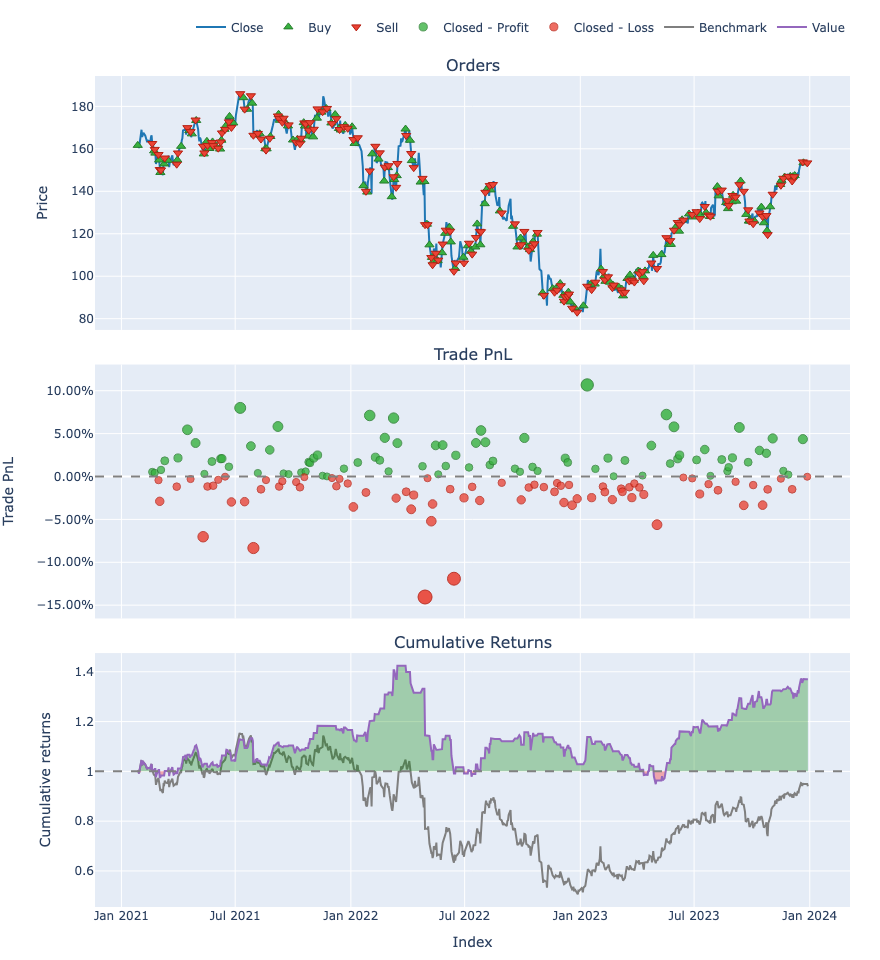

Start                         2021-01-27 00:00:00
End                           2023-12-29 00:00:00
Period                                        737
Start Value                                 100.0
End Value                              137.016422
Total Return [%]                        37.016422
Benchmark Return [%]                    -5.994593
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        33.384863
Max Drawdown Duration                       441.0
Total Trades                                  159
Total Closed Trades                           159
Total Open Trades                               0
Open Trade PnL                                0.0
Win Rate [%]                            51.572327
Best Trade [%]                          10.676115
Worst Trade [%]                        -14.049441
Avg Winning Trade [%]                    2.393777
Avg Losing Trade [%]                    -2.091079


In [118]:
price = data['AMZN.O'].loc[test_data_final.index]  # Replace with the actual price data for the asset
dt_signals = tree_classifier.predict(X_test_reduced)  # Replace with the actual signal predictions from your model

# Backtesting
dt_pf = vbt.Portfolio.from_signals(price, entries=dt_signals == 1, exits=dt_signals == 0)
dt_pf_stats = dt_pf.stats()

# Visualize the equity curve
dt_pf.plot().show()

# Print performance metrics
print(dt_pf_stats)

The Decision Tree classifier's strategy is exhibiting some promising results. From the graph, it's apparent that the buy and sell orders have captured many of the upward and downward price movements respectively, indicating that the classifier has to some extent learned to identify pivotal moments for market entry and exit.

The Trade PnL plot demonstrates a more balanced mix of green and red dots, with the green dots distributed across a range of positive values, implying that the strategy has a decent share of profitable trades. This is reinforced by a win rate of over 51%, suggesting that more than half of the trades are profitable.

One of the most striking features is the cumulative returns plot, which shows a significant separation from the benchmark. The strategy not only outperforms the benchmark but also exhibits an upward trajectory, finishing with a total return of over 37%. This indicates that the strategy has been effective in capitalizing on the market movements of AMZN.O over the period.

However, the strategy isn't without its risks, as indicated by the maximum drawdown of over 33%, which, while lower than some other models, still represents a considerable risk. The duration of the drawdown is also quite lengthy, implying that an investor would have needed to withstand a substantial period of unrealized losses.

The profit factor being above 1 is encouraging, as it means that the gross profits from the winning trades outweigh the gross losses from the losing ones. The positive expectancy further adds to this favorable view, suggesting that on average, each trade contributes positively to the overall balance.

The Decision Tree classifier's trading strategy seems to be performing well, with returns exceeding the benchmark and a profit factor that implies effective management of winning and losing trades. Still, it's important to consider the drawdown and the risk it represents. For future development, incorporating additional risk management techniques or exploring ensemble methods could further enhance performance and mitigate drawdowns, potentially leading to an even more robust trading system.

Incorporating costs into the evaluation of the Decision Tree classifier strategy is critical for a real-world application. Costs such as brokerage fees, bid-ask spreads, slippage, and taxes will without doubt significantly impact the profitability of this trading strategy.

### 4- Random Forest

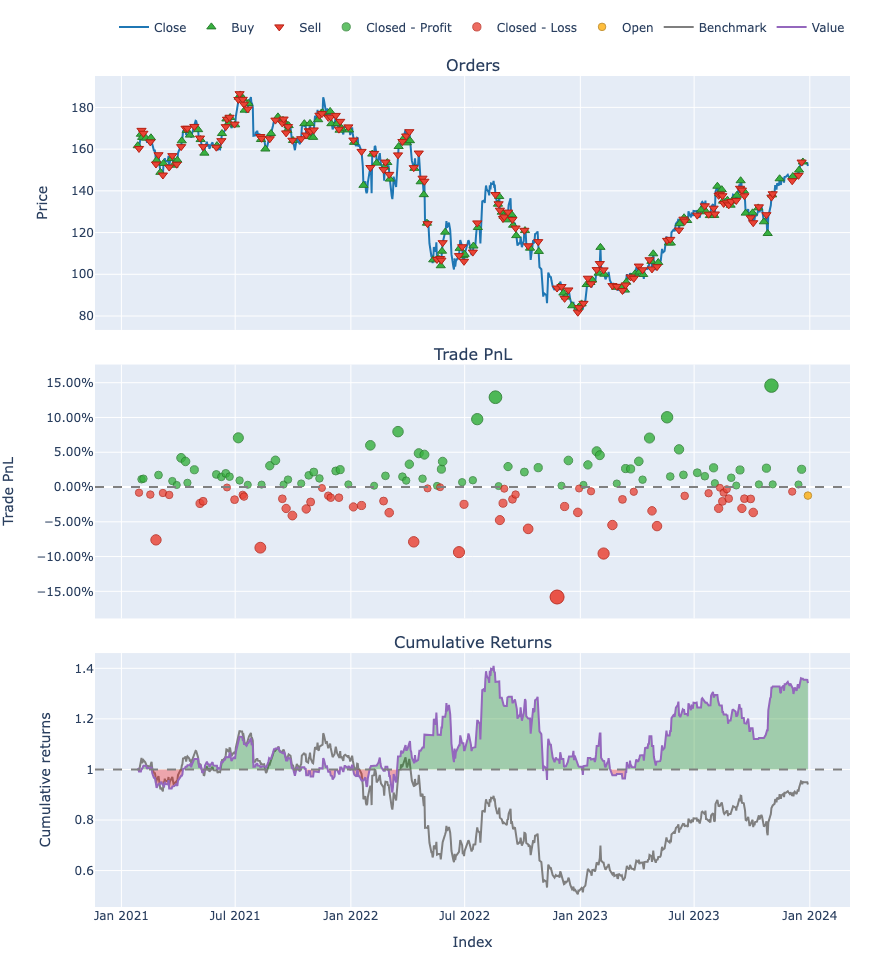

Start                         2021-01-27 00:00:00
End                           2023-12-29 00:00:00
Period                                        737
Start Value                                 100.0
End Value                              134.150624
Total Return [%]                        34.150624
Benchmark Return [%]                    -5.994593
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        32.018941
Max Drawdown Duration                       345.0
Total Trades                                  139
Total Closed Trades                           138
Total Open Trades                               1
Open Trade PnL                          -1.677545
Win Rate [%]                            56.521739
Best Trade [%]                          14.577235
Worst Trade [%]                         -15.81651
Avg Winning Trade [%]                    2.651777
Avg Losing Trade [%]                     -2.76145


In [119]:
price = data['AMZN.O'].loc[test_data_final.index]  # Replace with the actual price data for the asset
rf_signals = rf_classifier.predict(X_test_reduced)  # Replace with the actual signal predictions from your model

# Backtesting
rf_pf = vbt.Portfolio.from_signals(price, entries=rf_signals == 1, exits=rf_signals == 0)
rf_pf_stats = rf_pf.stats()

# Visualize the equity curve
rf_pf.plot().show()

# Print performance metrics
print(rf_pf_stats)

The trading strategy informed by the Random Forest model shows a notable total return of 34.15% over the given period, which is a significant outperformance compared to the negative benchmark return. The higher win rate of 56.52% compared to other models indicates a strong ability to pick profitable trades. The best trade showing a 14.58% gain also reflects the model's potential to capture sizeable positive movements.

However, transaction costs not accounted for in these statistics could reduce the strategy's profitability. Given the 139 trades made, even low per-trade costs could diminish the end value and return percentage notably. The profitability, as measured by the expectancy and profit factor, is positive, suggesting a buffer against moderate transaction costs. However, if costs were high, they could bring these metrics down to a break-even point or even into the loss territory.

The Trade PnL plot shows a scatter of red dots, representing losses, that are closely clustered around zero, indicating that losses might be small and controlled. However, a few larger losses suggest that some market conditions could lead to substantial drops, necessitating careful risk management.

The Orders chart indicates a good spread of buys and sells over the price action of AMZN.O, suggesting the model is utilizing a range of data features effectively to make decisions. The Cumulative Returns chart indicates that while there are fluctuations, the general trend of the strategy's equity curve is upwards, which is encouraging.

Considering the impact of costs, here are some takeaways:

Trade Cost Optimization: The strategy would benefit from reduced trading costs. Negotiating better commission rates or using a cost-effective execution platform would help preserve the gains made.

Risk Management: The maximum drawdown is over 32%, indicating that while the strategy can be profitable, it also risks substantial declines. Implementing a tighter stop-loss strategy could help mitigate these drawdowns.

Model Refinement: There may be room to improve the model's accuracy, reducing the number of losing trades and thus, the impact of costs.

Winning Trade Duration: The average duration of winning trades is higher than that of losing ones, suggesting the model is capturing longer positive trends. However, monitoring for potential overextension of positions would be wise to prevent reversals from eroding gains.

Overall, the Random Forest model exhibits a solid performance, but factoring in the costs could lead to essential strategy adjustments to maintain its profitability.

### 5-SVM Classifier

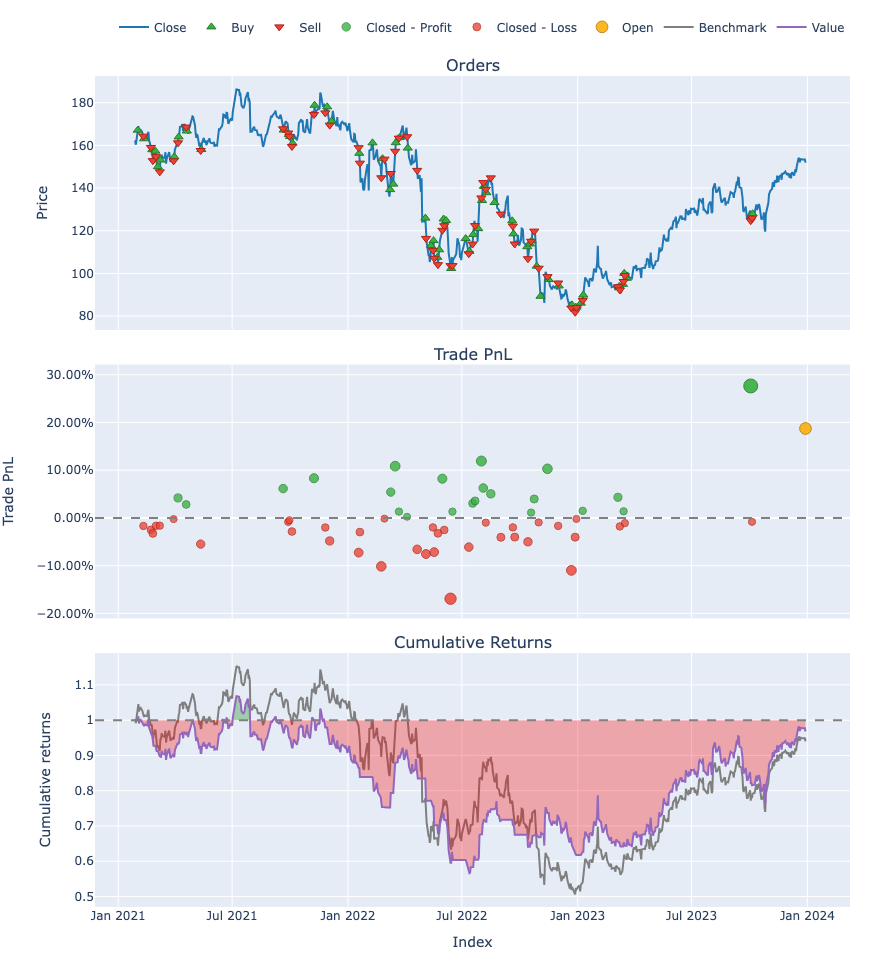

Start                                2021-01-27 00:00:00
End                                  2023-12-29 00:00:00
Period                                 737 days 00:00:00
Start Value                                        100.0
End Value                                      96.792524
Total Return [%]                               -3.207476
Benchmark Return [%]                           -5.994593
Max Gross Exposure [%]                             100.0
Total Fees Paid                                      0.0
Max Drawdown [%]                               47.067454
Max Drawdown Duration                  624 days 00:00:00
Total Trades                                          60
Total Closed Trades                                   59
Total Open Trades                                      1
Open Trade PnL                                 15.276324
Win Rate [%]                                   37.288136
Best Trade [%]                                 27.643025
Worst Trade [%]                

In [120]:
price = data['AMZN.O'].loc[test_data_final.index]  # Replace with the actual price data for the asset
svm_signals = linear_svc.predict(X_test_scaled)  # Use the correct model and scaled test data

# Backtesting
svm_pf = vbt.Portfolio.from_signals(price, entries=svm_signals == 1, exits=svm_signals == 0, freq='1D')
svm_pf_stats = svm_pf.stats()

# Visualize the equity curve
svm_pf.plot().show()

# Print performance metrics
print(svm_pf_stats)

This trading strategy powered by an SVM (Support Vector Machine) shows a moderate overall performance with an end value indicating a total return of -3.21%, which is slightly better than the benchmark's return of -5.99%. The strategy seems to have some defensive characteristics since it lost less than the benchmark in a presumably down-trending market.

The maximum drawdown is significant at over 47%, indicating that there were periods of substantial decline in portfolio value, which is a concern for risk management. The drawdown duration is quite extensive, which suggests that recovery from losses can be a long process.

A win rate of 37.28% suggests that the majority of trades are not profitable, but the average winning trade percentage is notably higher than that of the losing trades, implying that when trades are profitable, they tend to compensate for some of the losses. The best trade had a very high return, which suggests that the model can identify strong opportunities, albeit inconsistently.

The Trade PnL plot shows more red dots than green, indicating losses occur more frequently than gains. However, a few trades have resulted in significant profits, as indicated by the larger green dots.

Looking at the cumulative returns plot, the strategy has not managed to grow the initial investment over time, but it does show some resilience by not falling as far as the benchmark. The positive Sharpe and Sortino ratios indicate that the strategy achieves some positive risk-adjusted returns, but the low Calmar ratio shows poor performance relative to the risk of drawdown.

Incorporating costs into this evaluation would likely further reduce the total return and could turn a marginally underperforming strategy into a clearly unprofitable one. With 60 trades, even modest transaction costs could have a substantial impact. The profit factor is just below the breakeven point, so the addition of costs would likely push this below 1, suggesting the strategy would not be profitable on a net basis.

For improvements, one might look at refining the model to improve the win rate or the size of the wins, possibly by adjusting the SVM's kernel function or regularization parameter. Additionally, incorporating a more rigorous stop-loss strategy to reduce drawdowns and closely monitoring trade durations to avoid protracted losses could help in enhancing the risk-return profile.

#### 6 - Voting Classifier 

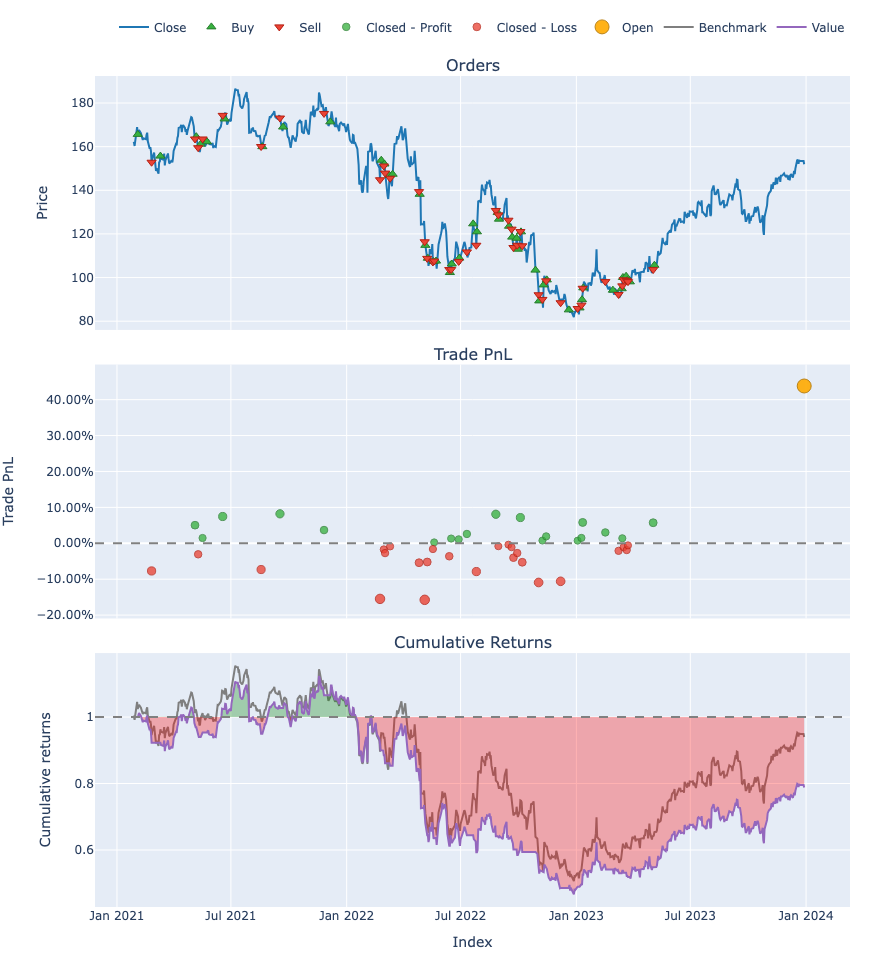

Start                         2021-01-27 00:00:00
End                           2023-12-29 00:00:00
Period                                        737
Start Value                                 100.0
End Value                               78.813531
Total Return [%]                       -21.186469
Benchmark Return [%]                    -5.994593
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        58.474462
Max Drawdown Duration                       530.0
Total Trades                                   45
Total Closed Trades                            44
Total Open Trades                               1
Open Trade PnL                          24.008716
Win Rate [%]                            43.181818
Best Trade [%]                           8.205441
Worst Trade [%]                        -15.749057
Avg Winning Trade [%]                    3.539052
Avg Losing Trade [%]                     -4.79543


In [121]:
price = data['AMZN.O'].loc[test_data_final.index]  # Replace with the actual price data for the asset
vot_classifier_signals = vot_classifier.predict(X_test_reduced)  # Replace with the actual signal predictions from your model

# Backtesting
vot_classifier_pf = vbt.Portfolio.from_signals(price, entries=vot_classifier_signals == 1, exits=vot_classifier_signals == 0)
vot_classifier_pf_stats = vot_classifier_pf.stats()

# Visualize the equity curve
vot_classifier_pf.plot().show()

# Print performance metrics
print(vot_classifier_pf_stats)

For the Voting Classifier strategy, we’re seeing a notable divergence from the benchmark’s performance, with the strategy ending with a -21.19% return over the specified period. This underperformance, alongside the significant maximum drawdown of over 58%, points to a higher risk profile and less favorable outcome compared to other strategies we've discussed.

The strategy executed a total of 45 trades, a relatively low trade frequency, which might imply a more conservative approach or a high threshold for signal generation. However, this lower frequency did not translate to better performance, as evidenced by the negative total return and the profit factor being considerably less than 1. This indicates that the losses were much larger than the gains.

The Win Rate of over 43% and the disparity between the average winning trade and the average losing trade further inform us that while the strategy did have successful trades, the losses were more substantial on average. The expectancy is negative, which suggests that on average, each trade resulted in a loss.

Looking at the cumulative returns, the strategy’s equity curve trends downwards consistently below the benchmark, with no clear recovery in sight. The long drawdown duration also indicates that the strategy may hold on to losing positions for too long or fail to capitalize on potential upswings effectively.

Given the high drawdown and overall loss, a professional might conclude that the strategy requires significant adjustment. The components of the Voting Classifier might need re-evaluation — perhaps some models are weighing down the performance or need parameter tuning. Also, incorporating transaction costs would likely further erode the performance, suggesting that even with no transaction costs considered, the strategy could benefit from a comprehensive overhaul focusing on better market timing, more robust signal generation, and stringent risk management protocols.








#### 7 - MLP Classifier

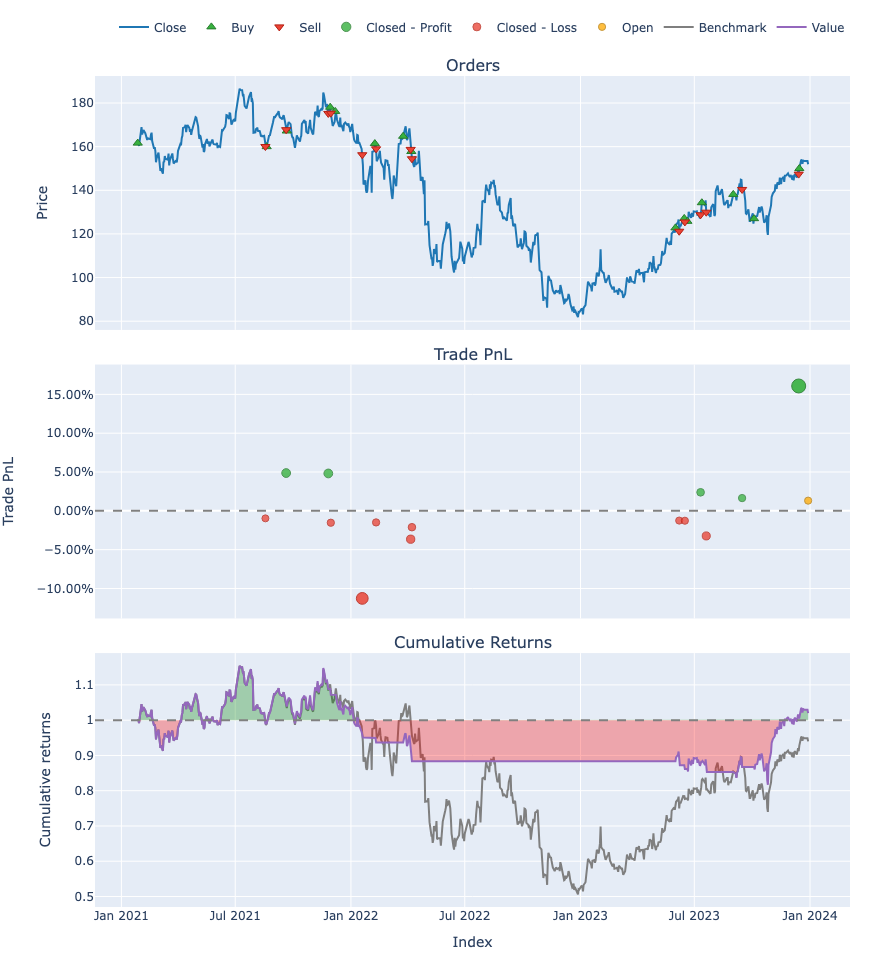

Start                         2021-01-27 00:00:00
End                           2023-12-29 00:00:00
Period                                        737
Start Value                                 100.0
End Value                              102.010905
Total Return [%]                         2.010905
Benchmark Return [%]                    -5.994593
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        29.250887
Max Drawdown Duration                       624.0
Total Trades                                   15
Total Closed Trades                            14
Total Open Trades                               1
Open Trade PnL                           1.322637
Win Rate [%]                            35.714286
Best Trade [%]                           16.07874
Worst Trade [%]                        -11.276676
Avg Winning Trade [%]                    5.957718
Avg Losing Trade [%]                    -2.976575


In [122]:
price = data['AMZN.O'].loc[test_data_final.index]  # Replace with the actual price data for the asset
mlp_model_signals = mlp_model.predict(X_test_reduced)  # Replace with the actual signal predictions from your model

# Backtesting
mlp_model_pf = vbt.Portfolio.from_signals(price, entries=mlp_model_signals == 1, exits=mlp_model_signals == 0)
mlp_model_pf_stats = mlp_model_pf.stats()

# Visualize the equity curve
mlp_model_pf.plot().show()

# Print performance metrics
print(mlp_model_pf_stats)

he MLP (Multi-Layer Perceptron) trading strategy has managed to deliver a positive return of 2.01% over the period, which compares favorably against the benchmark's negative return of approximately -6.00%. This suggests that the MLP has some predictive power and can capture upward market movements to end in positive territory.

With only 15 total trades, the strategy appears to be very selective in its approach, which is beneficial in terms of reducing transaction costs that can erode profits. This selective trading approach, however, comes with a relatively low win rate of approximately 35.71%. Despite this low win rate, the strategy is still profitable, suggesting that the MLP is effective at identifying trades with a high reward-to-risk ratio.

The sizeable best trade gain of over 16% shows that when the strategy works, it can capture significant market moves. However, the substantial worst trade loss of more than -11% also indicates that when the model is wrong, it can lead to significant drawdowns. A maximum drawdown of over 29% is quite high and might be concerning for risk-averse investors, especially considering the lengthy drawdown duration of 624 days.

The profit factor just above 1, along with the positive expectancy, indicates that the strategy is making more on winning trades than it's losing on the losers, albeit not by a wide margin. It would be essential to consider how transaction costs, if they were accounted for, would affect these metrics since they could potentially turn a just-profitable strategy into an unprofitable one.

Overall, the MLP-based strategy has demonstrated some effectiveness in the trading period, but given the risk metrics, it would be prudent to investigate ways to enhance the win rate and manage drawdowns more effectively. This could involve exploring different network architectures, additional feature engineering, or incorporating a more stringent risk management system.

#### Comparison of ML & AI based investment strategies:

In [124]:
# Generate signals using each model
nb_signals = nb_classifier.predict(X_test_reduced)
logreg_signals = logreg.predict(X_test_reduced)
dt_signals = tree_classifier.predict(X_test_reduced)
rf_signals = rf_classifier.predict(X_test_reduced)
svm_signals = linear_svc.predict(X_test_reduced)
vot_classifier_signals = vot_classifier.predict(X_test_reduced)
mlp_model_signals = mlp_model.predict(X_test_reduced)

# Prepare price data
price_data = data['AMZN.O'].iloc[-len(logreg_signals):]

# Run backtests for each model
nb_pf = vbt.Portfolio.from_signals(price_data, entries=nb_signals == 1, exits=nb_signals == 0)
logreg_pf = vbt.Portfolio.from_signals(price_data, entries=logreg_signals == 1, exits=logreg_signals == 0)
dt_pf = vbt.Portfolio.from_signals(price, entries=dt_signals == 1, exits=dt_signals == 0)
rf_pf = vbt.Portfolio.from_signals(price, entries=rf_signals == 1, exits=rf_signals == 0)
svm_pf = vbt.Portfolio.from_signals(price_data, entries=svm_signals == 1, exits=svm_signals == 0)
vot_classifier_pf = vbt.Portfolio.from_signals(price, entries=vot_classifier_signals == 1, exits=vot_classifier_signals == 0)
mlp_model_pf = vbt.Portfolio.from_signals(price, entries=mlp_model_signals == 1, exits=mlp_model_signals == 0)

# Get stats for each model
nb_stats = nb_pf.stats()
logreg_stats = logreg_pf.stats()
dt_stats = dt_pf.stats()
rf_stats = rf_pf.stats()
svm_stats = svm_pf.stats()
vot_classifier_stats = vot_classifier_pf.stats()
mlp_model_stats = mlp_model_pf.stats()

# Compare performance
comparison_df = pd.DataFrame({
    'Naive Bayes': nb_stats,
    'Logistic Regression': logreg_stats,
    'Decision Tree': dt_stats,
    'Random Forest': rf_stats,
    'SVM': svm_stats,
    'Voting Classifier': vot_classifier_stats,
    'MLP Classifier': mlp_model_stats
    
})



print(comparison_df)

                                    Naive Bayes  Logistic Regression  \
Start                       2021-01-27 00:00:00  2021-01-27 00:00:00   
End                         2023-12-29 00:00:00  2023-12-29 00:00:00   
Period                                      737                  737   
Start Value                               100.0                100.0   
End Value                             86.227036            68.115759   
Total Return [%]                     -13.772964           -31.884241   
Benchmark Return [%]                  -5.994593            -5.994593   
Max Gross Exposure [%]                    100.0                100.0   
Total Fees Paid                             0.0                  0.0   
Max Drawdown [%]                      59.773975            63.036892   
Max Drawdown Duration                     624.0                530.0   
Total Trades                                  9                   32   
Total Closed Trades                           8                 

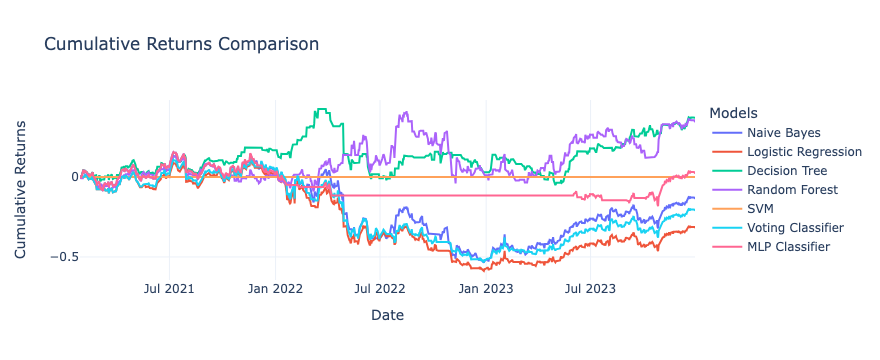

In [125]:
# Ensure we're using Plotly for plotting
nb_returns = nb_pf.cumulative_returns()
logreg_returns = logreg_pf.cumulative_returns()
dt_returns = dt_pf.cumulative_returns()
rf_returns = rf_pf.cumulative_returns()
svm_returns = svm_pf.cumulative_returns()
vot_classifier_returns = vot_classifier_pf.cumulative_returns()
mlp_model_returns = mlp_model_pf.cumulative_returns()


# Create a figure to plot on
fig = go.Figure()

# Add traces for each model's cumulative returns
fig.add_trace(go.Scatter(x=nb_returns.index, y=nb_returns, mode='lines', name='Naive Bayes'))
fig.add_trace(go.Scatter(x=logreg_returns.index, y=logreg_returns, mode='lines', name='Logistic Regression'))
fig.add_trace(go.Scatter(x=dt_returns.index, y=dt_returns, mode='lines', name='Decision Tree'))
fig.add_trace(go.Scatter(x=rf_returns.index, y=rf_returns, mode='lines', name='Random Forest'))
fig.add_trace(go.Scatter(x=svm_returns.index, y=svm_returns, mode='lines', name='SVM'))
fig.add_trace(go.Scatter(x=vot_classifier_returns.index, y=vot_classifier_returns, mode='lines', name='Voting Classifier'))
fig.add_trace(go.Scatter(x=mlp_model_returns.index, y=mlp_model_returns, mode='lines', name='MLP Classifier'))

# Update layout for better readability
fig.update_layout(
    title='Cumulative Returns Comparison',
    xaxis_title='Date',
    yaxis_title='Cumulative Returns',
    legend_title='Models',
    template='plotly_white'
)

# Show the plot
fig.show()

All models struggle to generate positive returns, which could imply a challenging market environment or perhaps the need for model optimization. The models seem to follow similar patterns of returns, suggesting they might be influenced by the same underlying market conditions or that they share similar predictive features. The choice of model might depend on the specific period or market conditions, as their performance relative to each other changes over time. This chart could be the basis for further analysis, such as examining the models' specific predictions, the features they're using, and whether any model calibration or feature engineering might improve results.

# Conclusion

Applying a Machine Learning technique to a dataset is as much an art as it is a science, given that selecting and fine-tuning a particular model involves a blend of both. No single ML algorithm universally outperforms others across diverse datasets. Specifically, some models may suffer from overfitting, showing promising results in backtesting but underperforming with new, unseen data. The stability of predictions in out-of-sample data presents a common hurdle in algorithmic and ML strategies alike. In our project, we explored various ML methods on equity index returns as a case study, uncovering intriguing findings that suggest valuable avenues for further investigation. This scenario underscores the potential of ML in forecasting, although the models we developed are preliminary and require additional refinement before practical application.

### Next steps
- the exploration of deep learning models, Long Short-Term Memory (LSTM) neural networks using Tensorflow Python package
- inclusion and in-depth analysis of more labels and more relevant data
- the exploration of reinforcement learning
- include Big Data by introducing alternative data
- further backtesting strategies to understand their historical performance, including transaction costs and slippage.

<br>
<br>
<br>
<br>

### Bilbliography

- Handbook of Artificial Intelligence and Big Data Applications in Investments (2023) - CFA Institute Research Foundation. This book can be found at cfainstitute.org/ai-and-big-data 
- López de Prado "Where are the Factors in Factor Investing?" available at https://www.cambridge.org/core/elements/causal-factor-investing/
- T. Guida. "Big Data and Machine Learning in Quantitative Investment". John Wiley & Sons, Ltd. ISBN 9781119522195. (2019)
- Y. Hilpisch Python for Finance (2nd ed., O’Reilly, 2018)
- Y. Hilpisch. (2020) Python for Algorithmic Trading. O’Reilly Media, Inc.
- Python for Data Analysis: Data Wrangling with Pandas, NumPy, and IPython (2018) by Wes McKinney Published by O’Reilly Media, Inc.,